# Differential abundance analysis on Pan Fetal dataset

We use Milo to quantify which subpopulations are enriched or depleted during development

In [1]:
%load_ext autoreload
%autoreload 2

In [360]:
import os,sys
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import scipy.sparse
import anndata
import seaborn as sns

In [3]:
## import utils
cwd = '../utils/'
sys.path.append(cwd)

import genes
import panfetal_utils

In [12]:
import milopy.core as milo
import milopy.plot as milopl

In [5]:
figdir = "/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/milo_analysis/"
if os.path.exists(figdir):
    sc.settings.figdir = figdir
else:
    os.mkdir(figdir)
    sc.settings.figdir = figdir
 

### Load data

In [6]:
data_dir="/nfs/team205/ed6/data/Fetal_immune/"
timestamp="20210429"

In [7]:
split="HSC_IMMUNE"
adata = sc.read_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.embedding.h5ad'.format(t=timestamp, s=split), backed="r")
adata.var_names_make_unique()

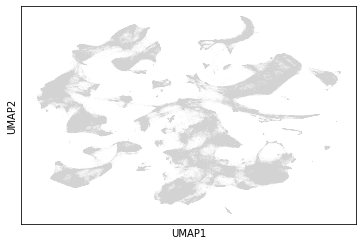

In [8]:
sc.pl.umap(adata)

### Make nhoods

How many nearest neighbors do I need if I want on average 3 cells from each organ in each neighbourhood?

In [785]:
adata.uns["scvi"]["params"]["n_neighbors"]

30

In [782]:
3 * len(adata.obs['organ'].unique())

27

I build a new knn graph with k=30

In [ ]:
sc.pp.neighbors(adata, )

In [9]:
milo.make_nhoods(adata, neighbors_key="scvi", prop=0.05)

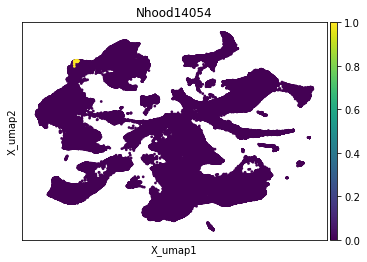

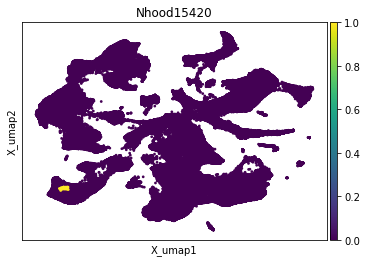

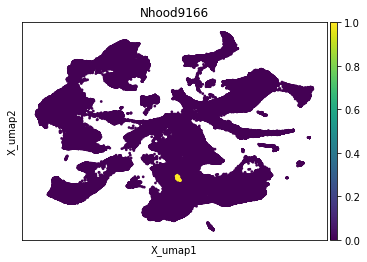

In [10]:
for i in np.random.choice(range(adata.obsm["nhoods"].shape[1]), size=3):
    milopl.plot_nhood(adata, i)

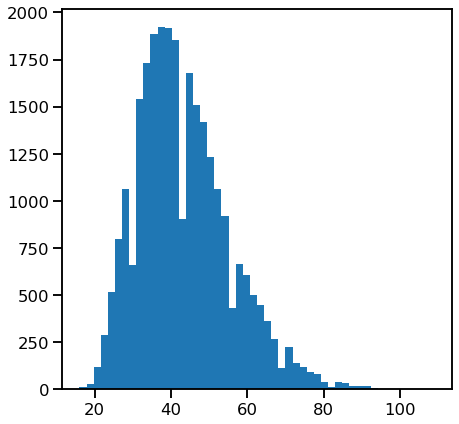

In [776]:
plt.rcParams["figure.figsize"] = [7,7]
plt.hist(np.array(adata.obsm["nhoods"].sum(0)).flatten(), bins=50);

### Count cells

In [11]:
milo.count_nhoods(adata, sample_col="Sample.lanes")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


### By age

Group into bins

In [14]:
cut_labels_4 = ['< 8pcw', '< 10pcw', '< 12pcw', '< 14pcw', '< 16pcw', '< 18pcw']
cut_bins = [0, 7, 10, 12, 14, 16, 18]
adata.obs["age_bins"] = pd.cut(adata.obs["age"], bins=cut_bins, labels=cut_labels_4).astype("str")
adata.obs["age_bins"] = pd.Categorical(adata.obs["age_bins"], categories=cut_labels_4, ordered=True)
adata.obs["age_bins"]

index
FCAImmP7579224-ATTACTCTCGATGAGG    < 12pcw
FCAImmP7579224-CAGCCGAGTACATCCA    < 12pcw
FCAImmP7579224-TGCTACCTCATGTAGC    < 12pcw
FCAImmP7579224-ACGGCCACAAGCTGAG    < 12pcw
FCAImmP7579224-CTAATGGCACTGTGTA    < 12pcw
                                    ...   
FCAImmP7803042-TTTGGTTCAGTTCCCT    < 14pcw
FCAImmP7803042-TCTCATATCCTATGTT    < 14pcw
FCAImmP7803042-TCAACGATCATTGCGA    < 14pcw
FCAImmP7803042-CATGGCGCACAGACAG    < 14pcw
FCAImmP7803042-CGACCTTTCGTCGTTC    < 14pcw
Name: age_bins, Length: 593203, dtype: category
Categories (6, object): ['< 8pcw' < '< 10pcw' < '< 12pcw' < '< 14pcw' < '< 16pcw' < '< 18pcw']

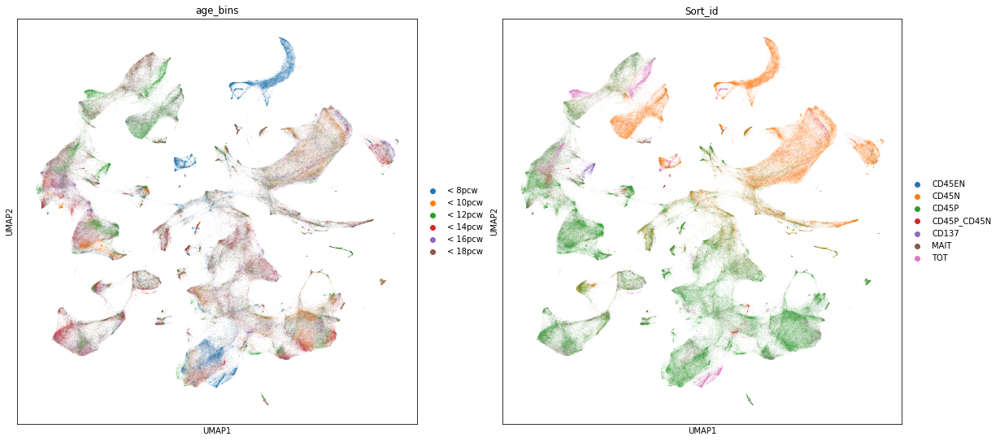

In [18]:
plt.rcParams["figure.figsize"] = [9,9]
sc.pl.umap(adata, color=["age_bins",'Sort_id'])

Test for differential abundance accounting for sorting strategy -- **N.B. we will repeat with more accurate CD45 quantification**

In [22]:
## Convert covariate to continous
adata.obs['age_bins'] = adata.obs['age_bins'].cat.codes

### Fix sort ids
adata.obs["Sort_id"] = ["CD45P" if x == "CD45P_CD45N" else x for x in adata.obs["Sort_id"]]

In [437]:
milo.DA_nhoods(adata, design="~ Sort_id + age_bins")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


In [1076]:
# adata.uns["nhood_adata"].obs['abs_logFC'] = abs(adata.uns["nhood_adata"].obs['logFC'])
# ordered = adata.uns["nhood_adata"].obs.sort_values('abs_logFC').index
# adata.uns["nhood_adata"] = adata.uns["nhood_adata"][ordered]

In [24]:
import milopy
milopy.utils.build_nhood_graph(adata, basis="X_umap")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorica

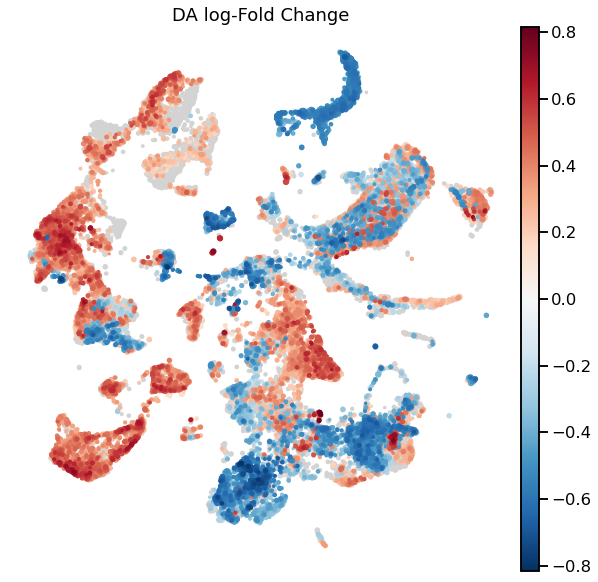

In [438]:
plt.rcParams["figure.figsize"] = [10,10]
sns.set_context("talk")
milopl.plot_nhood_graph(adata, min_size=2, alpha=0.05, min_logFC=0)

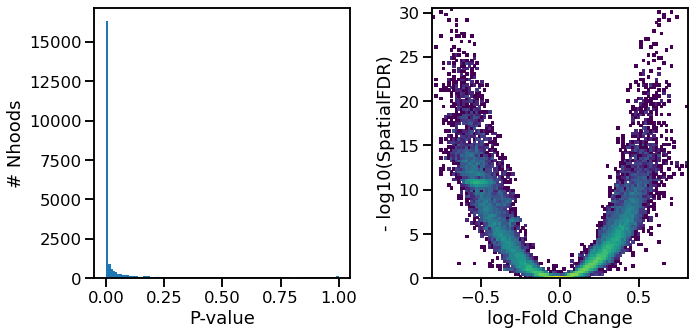

In [439]:
plt.rcParams["figure.figsize"] = [10,5]
plt.subplot(121);
plt.hist(adata.uns["nhood_adata"].obs["PValue"], bins=100);
plt.xlabel("P-value");plt.ylabel("# Nhoods");
plt.subplot(122);
plt.hist2d(adata.uns["nhood_adata"].obs["logFC"], -np.log10(adata.uns["nhood_adata"].obs["SpatialFDR"]), bins=100,
          norm=matplotlib.colors.LogNorm());
plt.xlabel("log-Fold Change");plt.ylabel("- log10(SpatialFDR)");
plt.tight_layout()

In [345]:
def annotate_nhoods(adata, anno_col):
    anno_dummies = pd.get_dummies(adata.obs[anno_col])
    anno_count = adata.obsm["nhoods"].T.dot(scipy.sparse.csr_matrix(anno_dummies.values))
    anno_frac = np.array(anno_count/anno_count.sum(1))

    anno_frac = pd.DataFrame(anno_frac, 
                             columns=anno_dummies.columns,
                             index=adata.uns["nhood_adata"].obs_names
                            )
    adata.uns["nhood_adata"].obsm["frac_annotation"] = anno_frac.values
    adata.uns["nhood_adata"].uns["annotation_labels"] = anno_frac.columns
    adata.uns["nhood_adata"].obs["nhood_annotation"] = anno_frac.idxmax(1)
    adata.uns["nhood_adata"].obs["nhood_annotation_frac"] = anno_frac.max(1)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorical


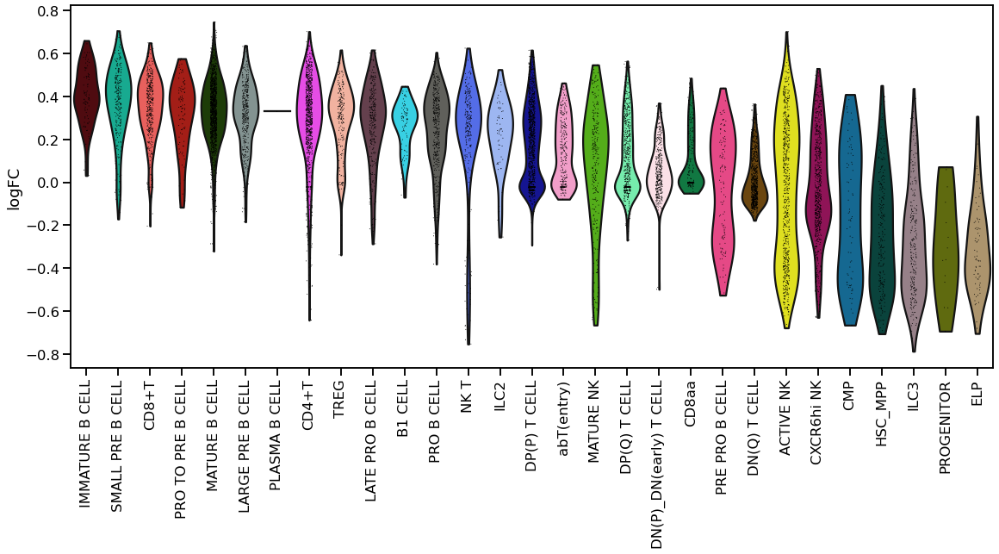

In [346]:
annotate_nhoods(adata, anno_col="anno_lvl_2_LYMPHOID")

nhood_adata = adata.uns["nhood_adata"].copy()

sorted_annos = nhood_adata.obs[nhood_adata.obs["nhood_annotation"]!="nan"][["nhood_annotation","logFC"]].\
    groupby('nhood_annotation').\
    median().\
    sort_values("logFC", ascending=False).index

sc.pl.violin(nhood_adata[nhood_adata.obs["nhood_annotation"]!="nan"], "logFC", 
             groupby="nhood_annotation",rotation=90, order=sorted_annos)

In [348]:
annotate_nhoods(adata, anno_col="anno_lvl_2_LYMPHOID")
adata.uns["nhood_adata"].obs["nhood_annotation_LYMPHOID"] = adata.uns["nhood_adata"].obs["nhood_annotation"].copy()
adata.uns["nhood_adata"].obsm["frac_annotation_LYMPHOID"] = adata.uns["nhood_adata"].obsm["frac_annotation"].copy()

annotate_nhoods(adata, anno_col="organ")
nhood_adata = adata.uns["nhood_adata"].copy()
# nhood_adata.obs["nhood_annotation_LYMPHOID"]
df = pd.DataFrame(nhood_adata[nhood_adata.obs["nhood_annotation_LYMPHOID"].isin(["ILC3"])].obsm['frac_annotation'])

df.columns= nhood_adata.uns["annotation_labels"]
df.index = nhood_adata[nhood_adata.obs["nhood_annotation_LYMPHOID"].isin(["ILC3"])].obs_names

df = pd.concat([df,nhood_adata[nhood_adata.obs["nhood_annotation_LYMPHOID"].isin(["ILC3"])].obs[["logFC","SpatialFDR"]]], 1)
df = df.sort_values("logFC", ascending=False)
# df = df.drop("logFC", 1)

In [349]:
%%R -i df -w 1000 -h 500
df %>%
rownames_to_column("Nhood") %>%
pivot_longer(cols=-c(Nhood, SpatialFDR, logFC), names_to="organ", values_to="fraction") %>%
arrange(- logFC) %>%
mutate(Nhood=factor(Nhood, levels=unique(Nhood))) %>%
mutate(color=ifelse(SpatialFDR < 0.1, "Spatial FDR < 0.1", NA)) %>%
ggplot(aes(x=logFC, y=fraction, color=color)) + geom_point() +
facet_wrap(organ~., scale="free_y") +
theme_bw(base_size=16)

UsageError: Cell magic `%%R` not found.


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorical


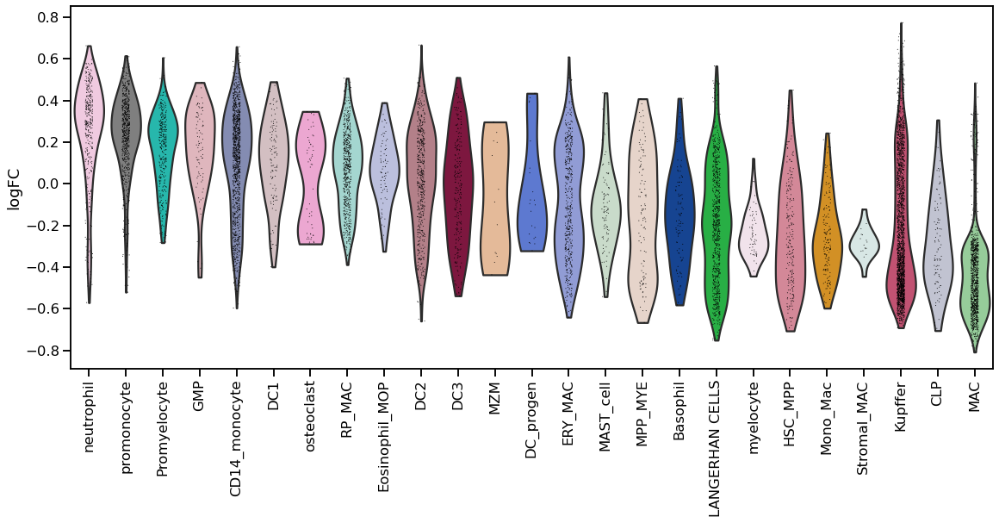

In [350]:
annotate_nhoods(adata, anno_col="anno_lvl_2_MYELOID")

nhood_adata = adata.uns["nhood_adata"].copy()

sorted_annos = nhood_adata.obs[nhood_adata.obs["nhood_annotation"]!="nan"][["nhood_annotation","logFC"]].\
    groupby('nhood_annotation').\
    median().\
    sort_values("logFC", ascending=False).index

sc.pl.violin(nhood_adata[nhood_adata.obs["nhood_annotation"]!="nan"], "logFC", 
             groupby="nhood_annotation",rotation=90, order=sorted_annos)

### Is differential abundance driven by organ sampling?

Goals:

- **Not driven by organ** --> identify neighbourhoods where the FC with age estimated on the full dataset is concordant with the FC estimated in single organs
- **Driven by organ** 
    - instances where there is FC discordance between different organs
    - instances where there is significan FC just for one organ

In [442]:
## Save results from total
milo_res_tot = adata.uns["nhood_adata"].obs.copy()
milo_res_tot

,kth_distance,SpatialFDR,Nhood_size,nhood_annotation,nhood_annotation_frac,nhood_annotation_LYMPHOID,logFC,logCPM,F,PValue,FDR
0,2.137471,9.165285e-02,48.0,DC2,0.895833,nan,-0.232131,9.497582,8.980452,6.625663e-02,9.452668e-02
1,2.518834,1.007637e-01,27.0,CD14_monocyte,0.740741,nan,-0.158825,9.421998,5.000128,7.343092e-02,1.038233e-01
2,2.352816,5.214532e-01,35.0,Mono_Mac,0.542857,nan,-0.064261,9.435193,0.581452,4.470435e-01,5.273267e-01
3,2.333254,4.375893e-03,34.0,DC3,0.558824,nan,-0.227853,9.422735,9.503789,2.476066e-03,4.637189e-03
4,2.617172,3.020105e-10,17.0,MAC,0.882353,nan,-0.384879,9.375940,77.818776,5.954749e-11,3.549186e-10
...,...,...,...,...,...,...,...,...,...,...,...
27293,1.159492,2.585065e-07,34.0,nan,1.000000,DN(Q) T CELL,0.360132,9.477708,34.429307,7.465996e-08,2.894160e-07
27294,2.249756,1.496265e-03,53.0,nan,1.000000,DP(P) T CELL,0.341241,9.515340,19.552099,7.794328e-04,1.597729e-03
27295,1.099086,2.806473e-02,53.0,nan,1.000000,DP(P) T CELL,0.236956,9.490363,6.389489,1.842825e-02,2.930698e-02
27296,1.268403,1.115516e-01,37.0,nan,1.000000,DN(Q) T CELL,0.124606,9.507288,3.078137,8.196543e-02,1.148433e-01


In [372]:
sample_col="Sample.lanes"
df = adata.obs[["organ",sample_col, "age_bins"]].drop_duplicates()
df = df.groupby(["organ","age_bins"]).count().reset_index().pivot("organ",columns="age_bins")
# sns.pointplot(data=df, x="organ", y="age_bins")

<AxesSubplot:xlabel='None-age_bins', ylabel='organ'>

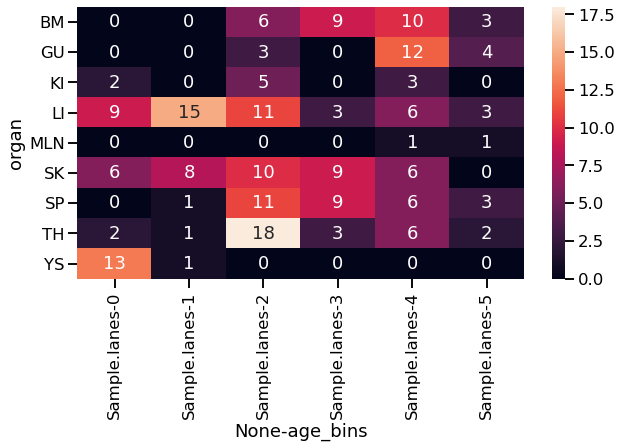

In [373]:
sns.heatmap(df,annot=True)

We compute the DA coefficient for all organs for which we have at least 3 time point bins (exclude YS and MLN) --> show that coefficient in all samples is the same as organ-wise 

In [374]:
import milopy.core as milo

In [375]:
## Keep organs covering at least two time-points
sampled_organs = df.index[(df!=0).sum(1) > 2]

## Calculate logFC within each organ
milo_res_dict = {}
for org in sampled_organs:
    org_samples = adata.obs[adata.obs["organ"] == org][sample_col].unique()
    milo.DA_nhoods(adata, design="~ Sort_id + age_bins", subset_samples=org_samples)
    milo_res_dict[org] = adata.uns["nhood_adata"].obs.copy()

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/pyth

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorica

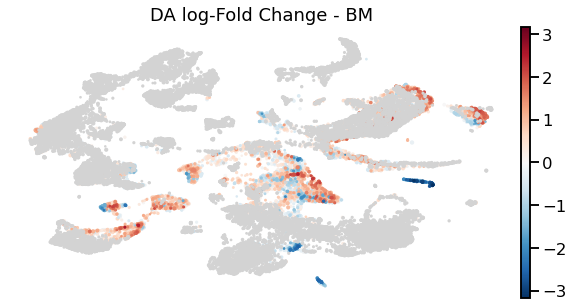

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorica

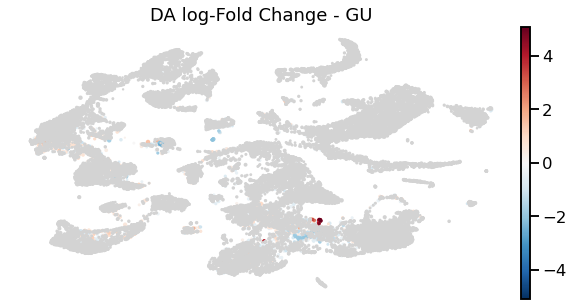

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorica

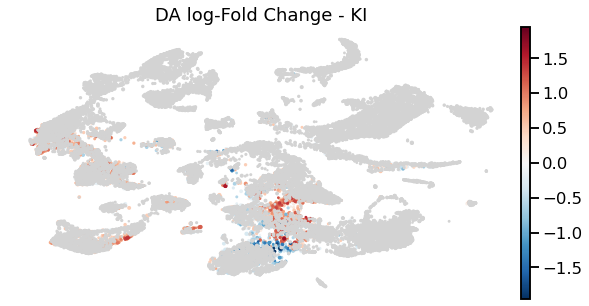

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorica

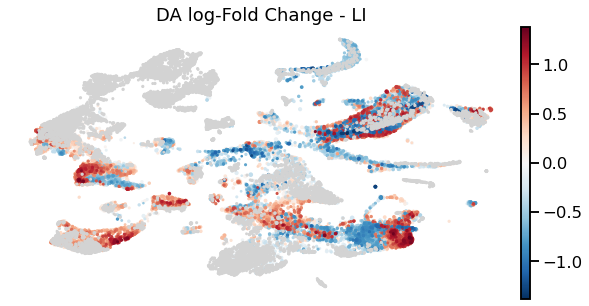

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorica

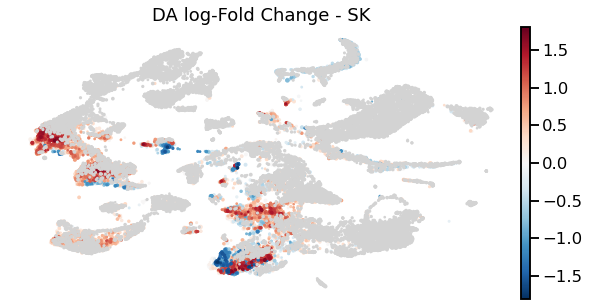

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorica

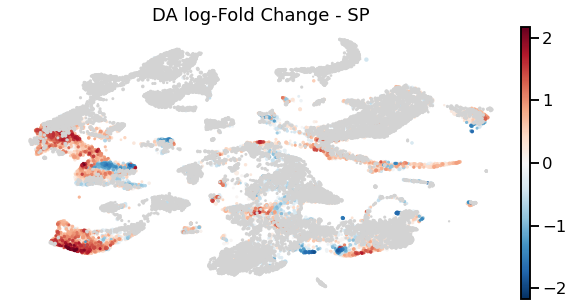

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorica

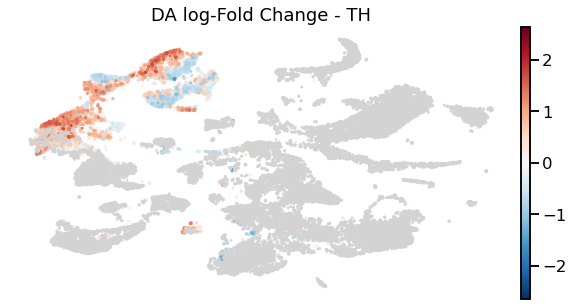

In [376]:
for org,res in milo_res_dict.items():
    nhood_adata = adata.uns["nhood_adata"]
    if any([x in nhood_adata.obs.columns for x in res.columns]):
        nhood_adata.obs = nhood_adata.obs.drop(res.columns, axis=1)
    nhood_adata.obs = pd.concat([nhood_adata.obs, res], 1)
    milopl.plot_nhood_graph(adata, min_size=1, alpha=0.1, title="DA log-Fold Change - " + org, save="milograph_{o}.png".format(o=org))
#     sc.pl.umap(adata, color="organ", groups=[org], size=3)

In [544]:
logFC_df_ls = [v["logFC"] for k,v in milo_res_dict.items()]
for k,v in milo_res_dict.items():
    milo_res_dict[k]["logFC_" + k] = milo_res_dict[k]["logFC"].copy()
    milo_res_dict[k]["SpatialFDR_" + k] = milo_res_dict[k]["SpatialFDR"].copy()
    milo_res_dict[k].loc[milo_res_dict[k]["SpatialFDR"] > 0.1, "logFC_" + k] = np.nan

org_fc = pd.concat([v[["logFC_" + k]] for k,v in milo_res_dict.items()], 1)
org_fdr = pd.concat([v[["SpatialFDR_" + k]] for k,v in milo_res_dict.items()], 1)

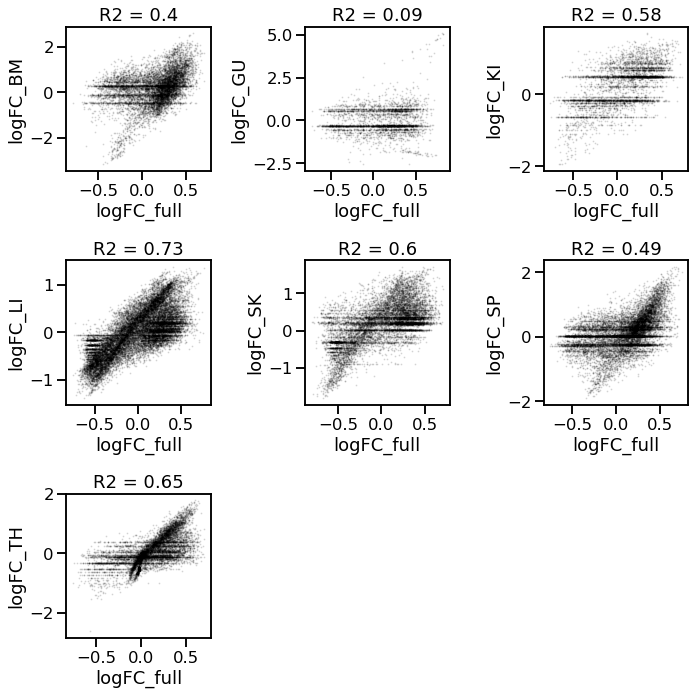

In [545]:
plt.rcParams["figure.figsize"] = [10,10]
for i in range(org_fc.shape[1]):
    plt.subplot(3,3,i+1);
    plt.plot(milo_res_tot["logFC"], org_fc[org_fc.columns[i]],".", alpha=0.1, color="black",
             markersize=2
    #            norm=matplotlib.colors.LogNorm(), bins=100
          );
#     plt.plot(milo_res_tot["logFC"][signif_nhoods], org_fc[org_fc.columns[i]][signif_nhoods],'.', 
#              alpha=0.5,
#              markersize=2, color="red");
    plt.ylabel(org_fc.columns[i]);
    plt.xlabel("logFC_full");
    r2 = pd.concat([milo_res_tot["logFC"], org_fc[org_fc.columns[i]]], 1).corr().iloc[0,1]
    plt.title("R2 = " + str(np.round(r2, 2)));
    plt.tight_layout()
#     plt.show()
# plt.hist(org_fc["logFC_TH"] - milo_res_tot["logFC"], bins=100);

<AxesSubplot:>

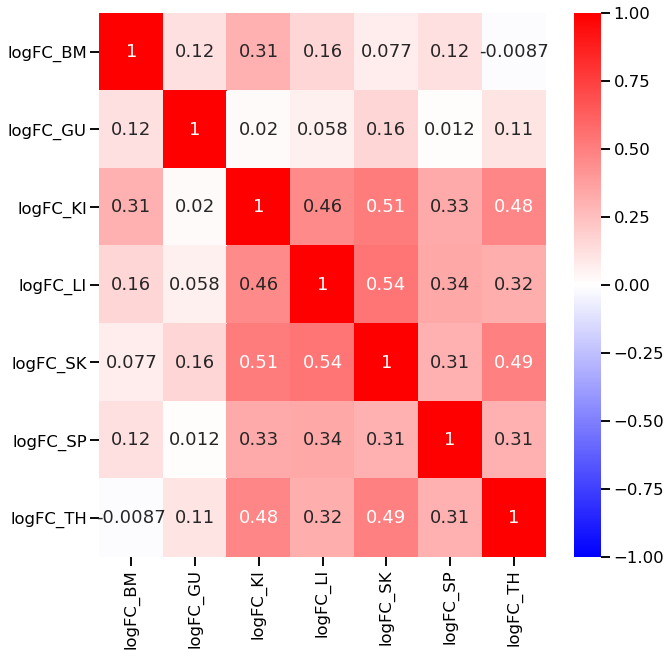

In [557]:
sns.heatmap(org_fc[signif_nhoods].corr(), annot=True, cmap='bwr', vmax=1, vmin=-1)

Which nhoods that are significant in all cells are not significant in any organ?

In [628]:
fp_nhoods = (org_fc.isna().sum(1)==7) & signif_nhoods

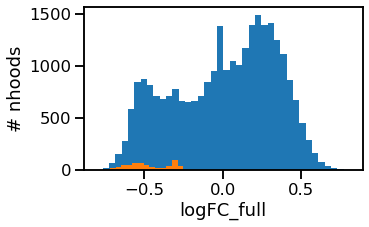

In [639]:
# plt.hist(organ_specific_nhoods.sum(1), bins=100);
plt.hist(milo_res_tot["logFC"], bins=40);
plt.hist(milo_res_tot[fp_nhoods]["logFC"], bins=40);
plt.ylabel('# nhoods');
plt.xlabel("logFC_full");

In [636]:
fp_nhoods.index[fp_nhoods][]

Index(['74', '75', '76', '78', '80', '81', '82', '83', '85', '86',
       ...
       '26903', '26909', '26910', '26914', '26916', '26917', '26918', '26925',
       '26929', '26934'],
      dtype='object', length=580)

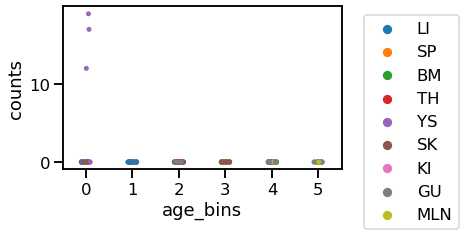

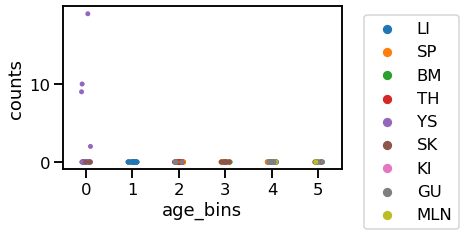

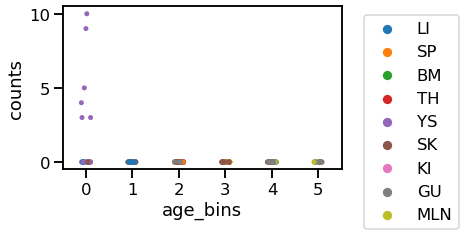

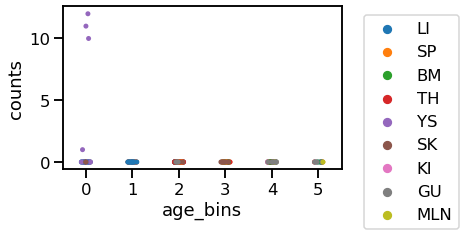

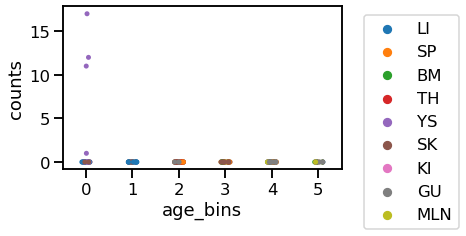

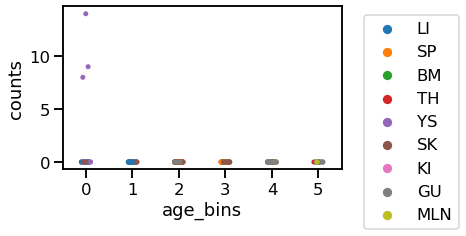

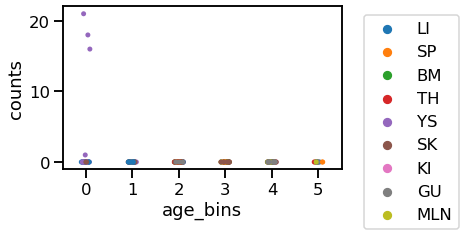

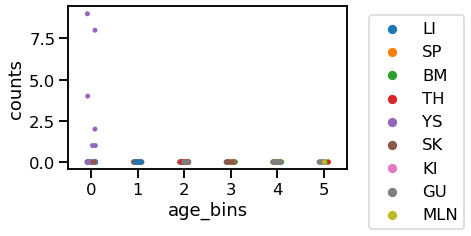

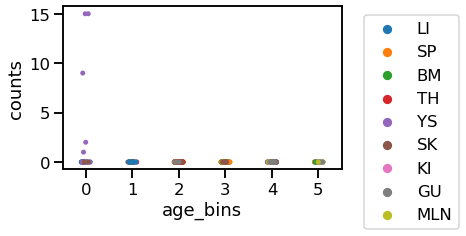

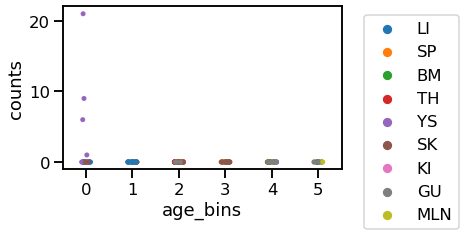

In [638]:
nhood_ixs = np.random.choice(range(fp_nhoods.sum()), size=10)
plt.rcParams["figure.figsize"] = [5,3]
for i in nhood_ixs:
    plot_nhood_counts(adata, fp_nhoods.index[fp_nhoods][i]);
    plt.show()

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorical


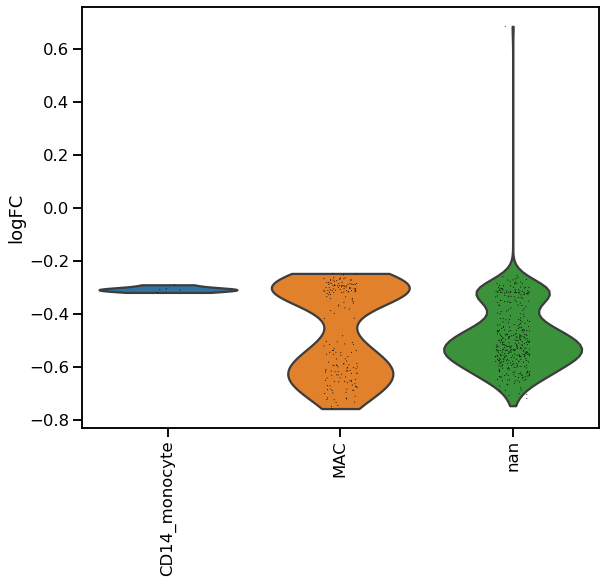

In [648]:
plt.rcParams["figure.figsize"] = [6,6]
nhood_adata = adata.uns["nhood_adata"].copy()
nhood_adata.obs = milo_res_tot.copy()
    
sc.pl.violin(nhood_adata[fp_nhoods], "logFC", 
             groupby="nhood_annotation",rotation=90)

Visualize fold change of neighbourhoods that are significant just in one organ (where we can't generalize the finding to the full dataset)

In [580]:
organ_specific_nhoods = org_fc.isna().sum(1) == 6

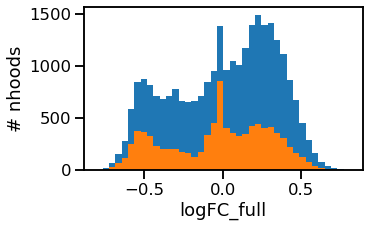

In [640]:
# plt.hist(organ_specific_nhoods.sum(1), bins=100);
plt.hist(milo_res_tot["logFC"], bins=40);
plt.hist(milo_res_tot[organ_specific_nhoods]["logFC"], bins=40);
plt.ylabel('# nhoods');
plt.xlabel("logFC_full");

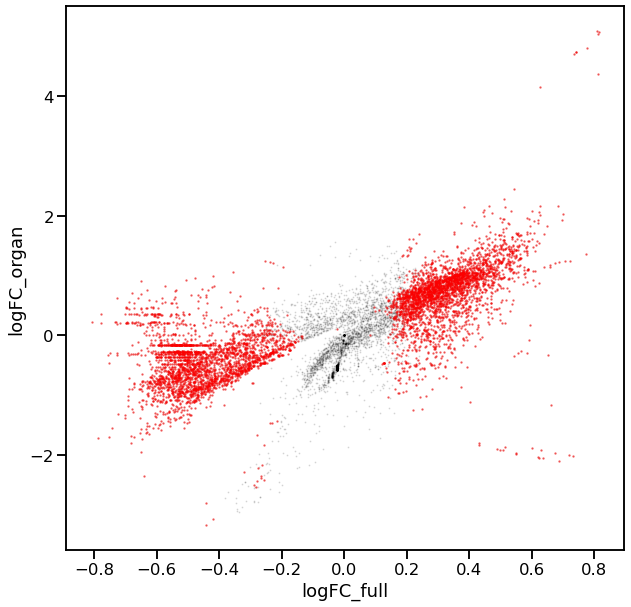

In [581]:
# plt.hist(organ_specific_nhoods.sum(1), bins=100);
plt.plot(milo_res_tot[organ_specific_nhoods]["logFC"], org_fc[organ_specific_nhoods].sum(1),".", alpha=0.1, color="black",
             markersize=2);
plt.plot(milo_res_tot[organ_specific_nhoods & signif_nhoods]["logFC"], org_fc[organ_specific_nhoods & signif_nhoods].sum(1),".", alpha=0.4,
             markersize=3, color='red');
plt.ylabel('logFC_organ');
plt.xlabel("logFC_full");

Visualize cell counts in some of these organ specific neighbourhoods

In [596]:
def plot_nhood_counts(adata, nhood_id):
    nhood_adata = adata.uns["nhood_adata"].copy()
    df = pd.DataFrame(nhood_adata[nhood_id].X.toarray().T)
    df.index = nhood_adata.var_names
    df["organ"] = nhood_adata.var["organ"]
    df["age_bins"] = nhood_adata.var["age_bins"]
    df["age_bins"] = df["age_bins"].astype("int")
    df = df.melt(id_vars=["organ", 'age_bins'])
    df["counts"] = df["value"]
    sns.stripplot(data=df, x="age_bins", y="counts", hue="organ");
    # sns.stripplot(data=df[df.organ=="LI"], x="age_bins", y="counts",color="red");
    plt.legend(  bbox_to_anchor=(1.05, 1), loc='upper left')

In [582]:
milopy.utils.add_covariate_to_nhoods_var(adata, ["organ"])

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


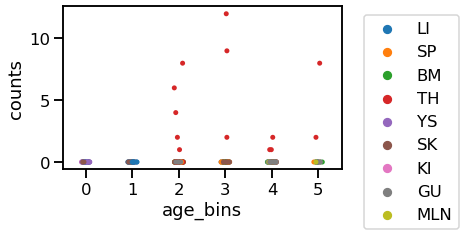

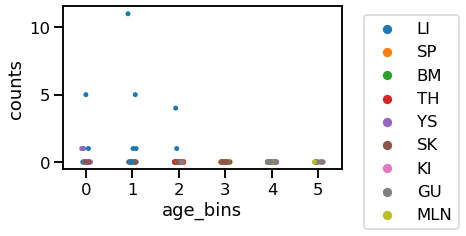

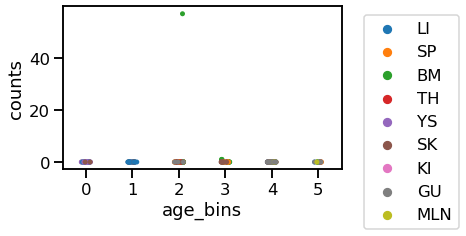

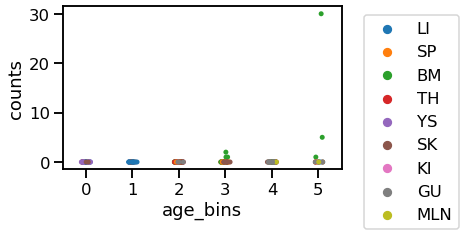

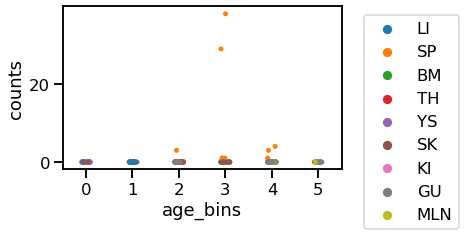

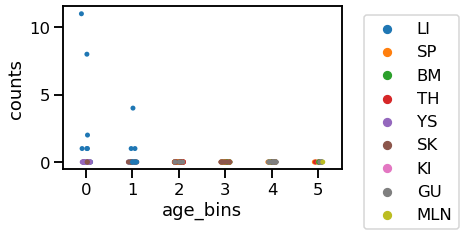

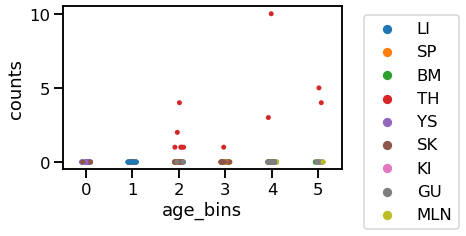

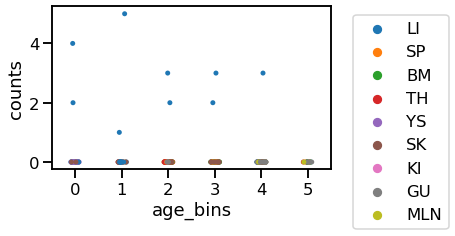

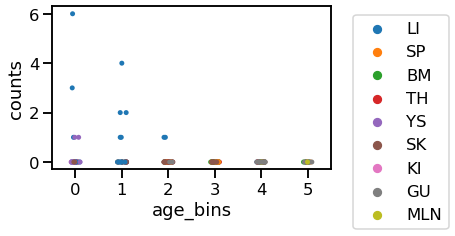

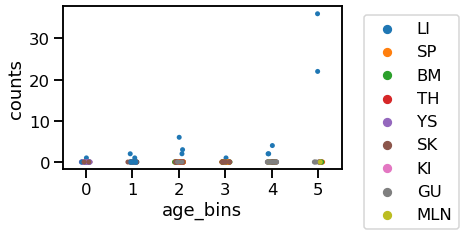

In [610]:
nhood_ixs = np.random.choice(range((organ_specific_nhoods & signif_nhoods).sum()), size=10)
plt.rcParams["figure.figsize"] = [5,3]
for i in nhood_ixs:
    plot_nhood_counts(adata, organ_specific_nhoods.index[organ_specific_nhoods & signif_nhoods][i]);
    plt.show()

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorical


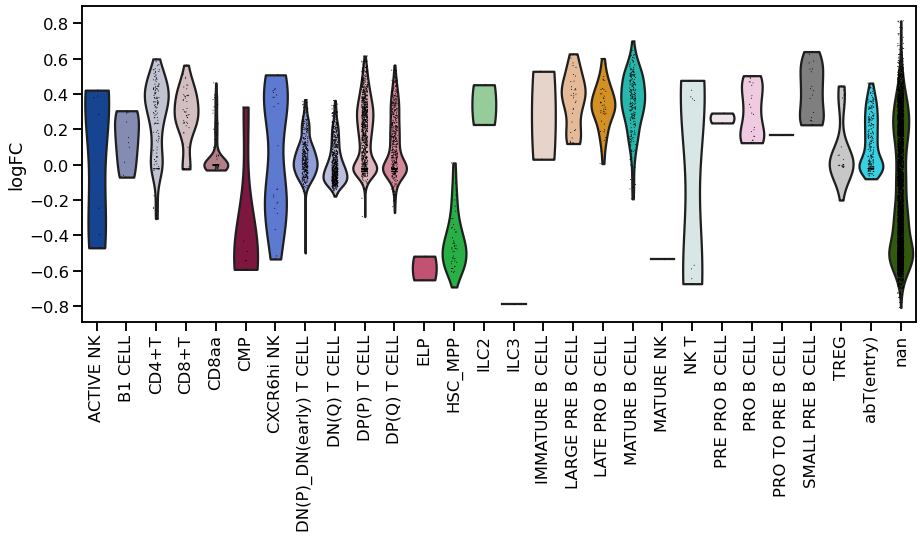

In [653]:
plt.rcParams["figure.figsize"] = [12,6]
nhood_adata = adata.uns["nhood_adata"].copy()
nhood_adata.obs = milo_res_tot.copy()
    
sc.pl.violin(nhood_adata[organ_specific_nhoods], "logFC", 
             groupby="nhood_annotation_LYMPHOID",rotation=90)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorical


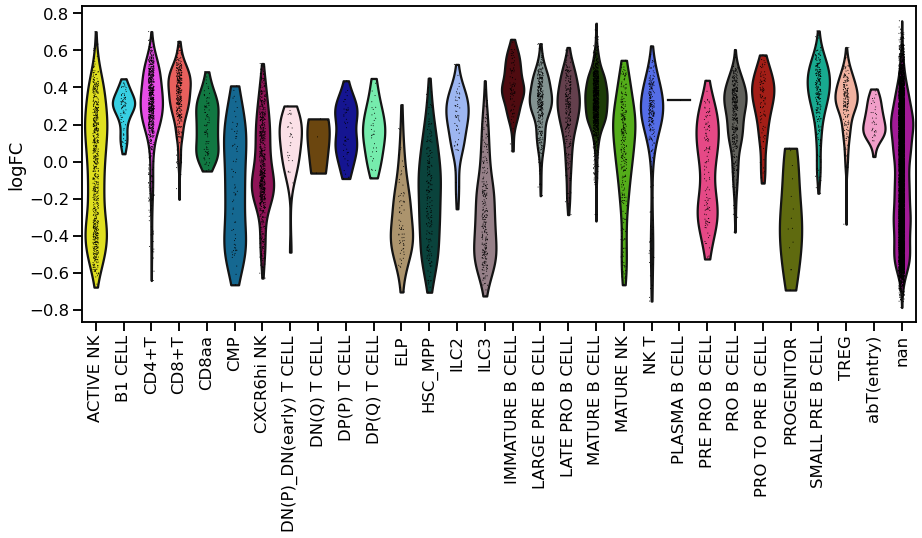

In [652]:
sc.pl.violin(nhood_adata[~organ_specific_nhoods], "logFC", 
             groupby="nhood_annotation_LYMPHOID",rotation=90)

(very) discordant logFC between organs

In [689]:
org_sign = np.sign(org_fc.max(1) * org_fc.min(1))
org_delta = org_fc.max(1) - org_fc.min(1)
org_max_fc = org_fc.abs().max(1)
discordant = org_sign==-1

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


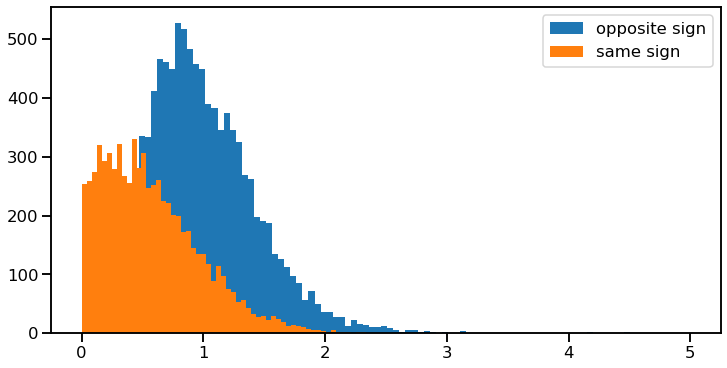

In [700]:
plt.hist(org_delta[discordant & -organ_specific_nhoods], bins=100, label="opposite sign");
plt.hist(org_delta[-discordant & -organ_specific_nhoods], bins=100, label="same sign");
plt.legend()

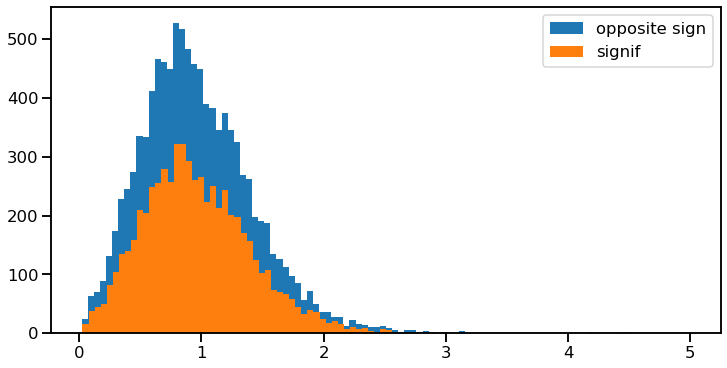

In [709]:
plt.hist(org_delta[discordant & -organ_specific_nhoods], bins=100, label="opposite sign");
plt.hist(org_delta[discordant & -organ_specific_nhoods & signif_nhoods], bins=100, label="signif");
plt.legend()

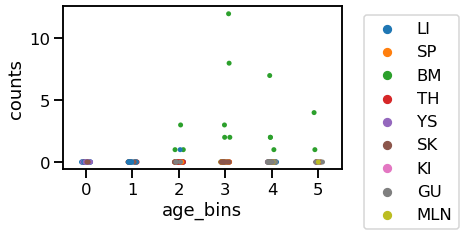

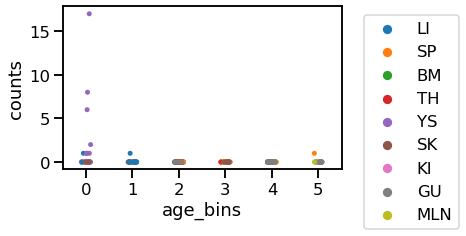

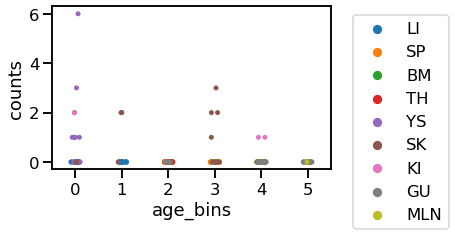

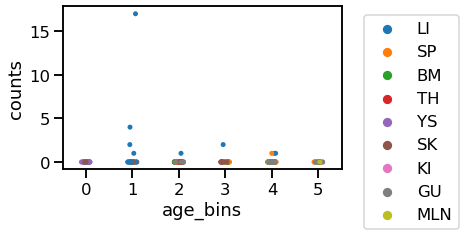

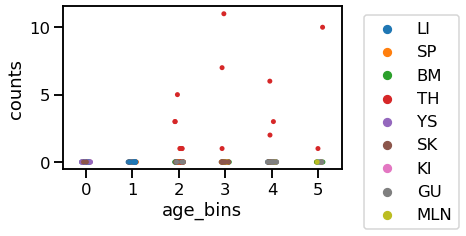

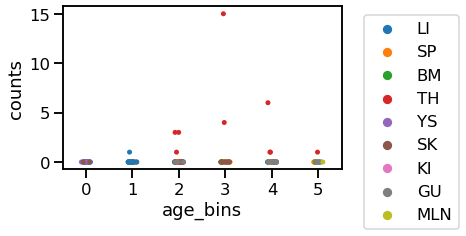

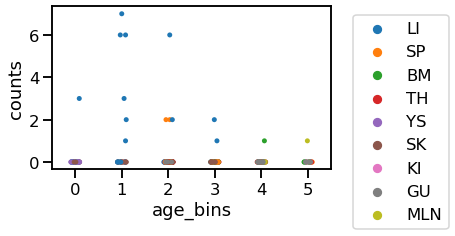

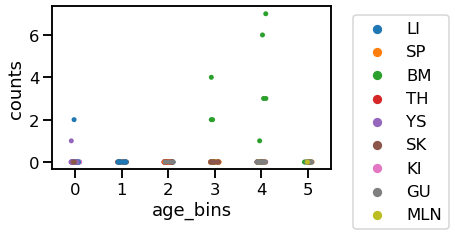

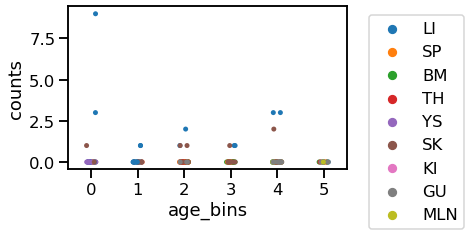

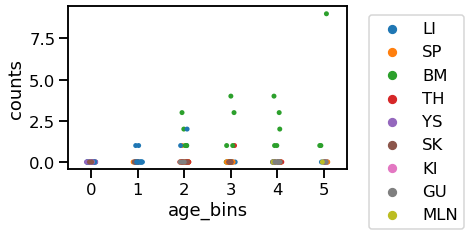

In [713]:
nhood_ixs = np.random.choice(range((discordant & -organ_specific_nhoods & signif_nhoods).sum()), size=10)
plt.rcParams["figure.figsize"] = [5,3]
for i in nhood_ixs:
    plot_nhood_counts(adata, organ_specific_nhoods.index[discordant & -organ_specific_nhoods & signif_nhoods][i]);
    plt.show()

Assert that nhoods need to have concordant logFC in at least 2 organs

In [721]:
tot_sign = np.sign(milo_res_tot["logFC"])
keep_nhoods = (np.sign(org_fc).T == tot_sign).T.sum(1) > 1

In [726]:
sum(keep_nhoods & signif_nhoods)

9133

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorical


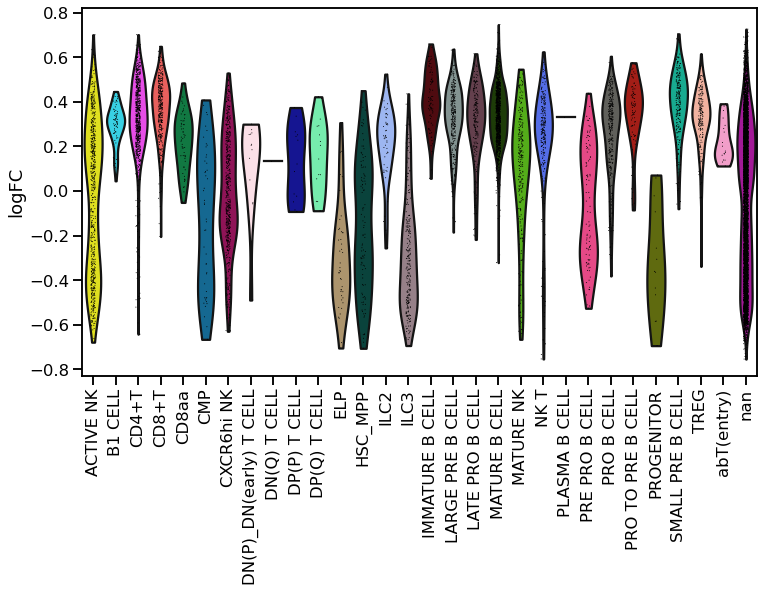

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorical


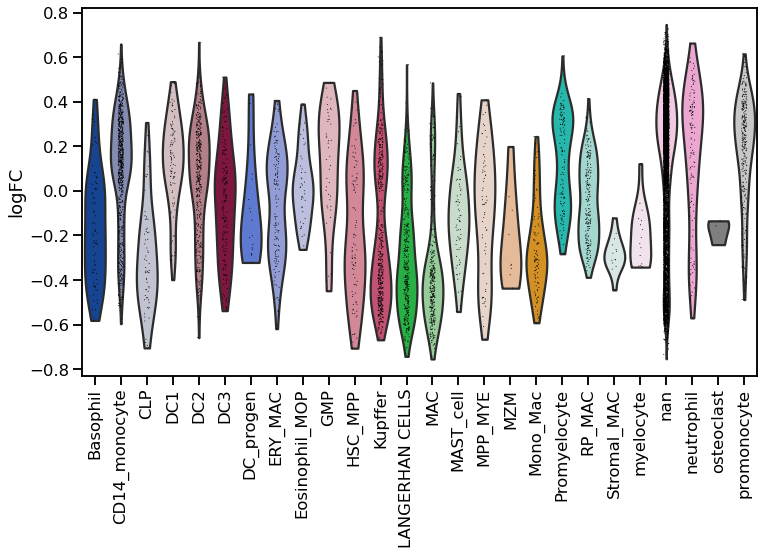

In [731]:
plt.rcParams["figure.figsize"] = [10,7]
sc.pl.violin(nhood_adata[keep_nhoods], "logFC", 
             groupby="nhood_annotation_LYMPHOID",rotation=90)
sc.pl.violin(nhood_adata[keep_nhoods & signif_nhoods], "logFC", 
             groupby="nhood_annotation",rotation=90)

In [786]:
alpha=0.05
min_logFC=0
min_size=1
plot_edges=False
title = "DA log-Fold Change"

In [787]:
plt.rcParams["figure.figsize"] = [14,14]

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as categorical


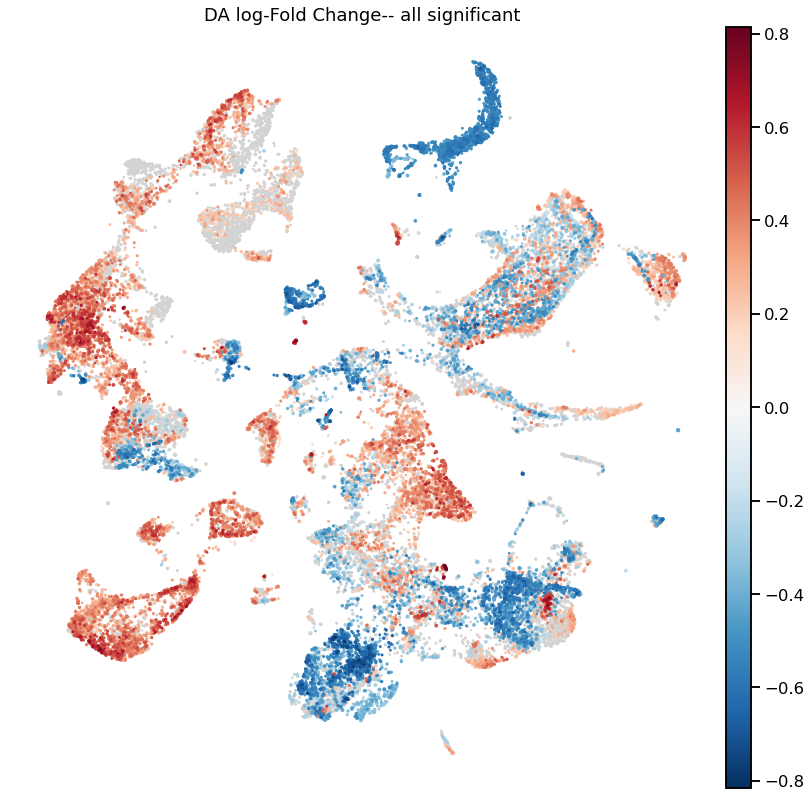

In [788]:
nhood_adata = adata.uns["nhood_adata"].copy()

nhood_adata.obs["graph_color"] = nhood_adata.obs["logFC"]
nhood_adata.obs.loc[nhood_adata.obs["SpatialFDR"] > alpha, "graph_color"] = np.nan
nhood_adata.obs["abs_logFC"] = abs(nhood_adata.obs["logFC"])
nhood_adata.obs.loc[nhood_adata.obs["abs_logFC"] < min_logFC, "graph_color"] = np.nan

## Mask values
# nhood_adata.obs["graph_color"][~keep_nhoods] = np.nan

## Plotting order - extreme logFC on top
nhood_adata.obs.loc[nhood_adata.obs["graph_color"].isna(), "abs_logFC"] = np.nan
ordered = nhood_adata.obs.sort_values('abs_logFC', na_position='first').index
nhood_adata = nhood_adata[ordered]

vmax = np.max([nhood_adata.obs["graph_color"].max(), abs(nhood_adata.obs["graph_color"].min())])
vmin = - vmax

sc.pl.embedding(nhood_adata, "X_milo_graph", 
                color="graph_color", cmap="RdBu_r",
                size=adata.uns["nhood_adata"].obs["Nhood_size"]*min_size, 
                edges=plot_edges, neighbors_key="nhood",
                # edge_width = 
                sort_order=False,
                frameon=False,
                vmax=vmax, vmin=vmin,
                title=title + "-- all significant"
               )

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort

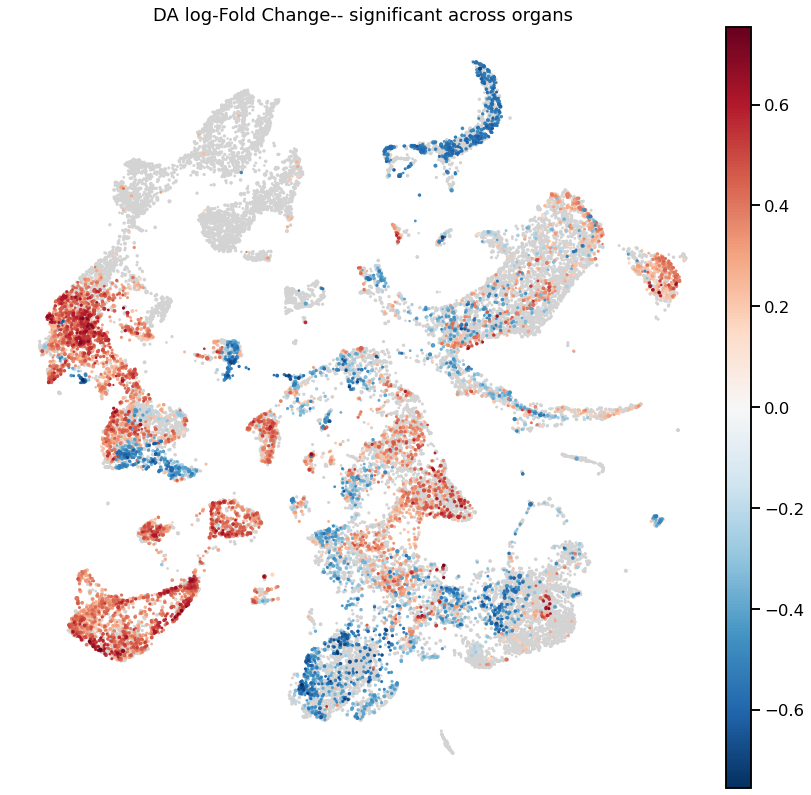

In [789]:
nhood_adata = adata.uns["nhood_adata"].copy()

nhood_adata.obs["graph_color"] = nhood_adata.obs["logFC"]
nhood_adata.obs.loc[nhood_adata.obs["SpatialFDR"] > alpha, "graph_color"] = np.nan
nhood_adata.obs["abs_logFC"] = abs(nhood_adata.obs["logFC"])
nhood_adata.obs.loc[nhood_adata.obs["abs_logFC"] < min_logFC, "graph_color"] = np.nan

## Mask values
nhood_adata.obs["graph_color"][~keep_nhoods] = np.nan

## Plotting order - extreme logFC on top
nhood_adata.obs.loc[nhood_adata.obs["graph_color"].isna(), "abs_logFC"] = np.nan
ordered = nhood_adata.obs.sort_values('abs_logFC', na_position='first').index
nhood_adata = nhood_adata[ordered]

vmax = np.max([nhood_adata.obs["graph_color"].max(), abs(nhood_adata.obs["graph_color"].min())])
vmin = - vmax

sc.pl.embedding(nhood_adata, "X_milo_graph", 
                color="graph_color", cmap="RdBu_r",
                size=adata.uns["nhood_adata"].obs["Nhood_size"]*min_size, 
                edges=plot_edges, neighbors_key="nhood",
                # edge_width = 
                sort_order=False,
                frameon=False,
                vmax=vmax, vmin=vmin,
                title=title + "-- significant across organs"
               )

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort

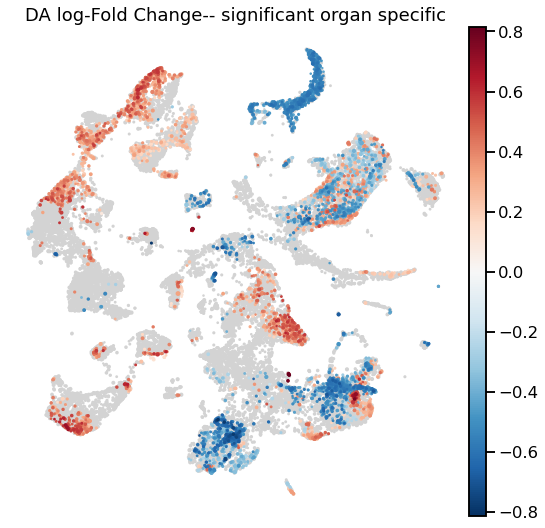

In [833]:
nhood_adata = adata.uns["nhood_adata"].copy()

nhood_adata.obs["graph_color"] = nhood_adata.obs["logFC"]
nhood_adata.obs.loc[nhood_adata.obs["SpatialFDR"] > alpha, "graph_color"] = np.nan
nhood_adata.obs["abs_logFC"] = abs(nhood_adata.obs["logFC"])
nhood_adata.obs.loc[nhood_adata.obs["abs_logFC"] < min_logFC, "graph_color"] = np.nan

## Mask values
nhood_adata.obs["graph_color"][~organ_specific_nhoods] = np.nan

## Plotting order - extreme logFC on top
nhood_adata.obs.loc[nhood_adata.obs["graph_color"].isna(), "abs_logFC"] = np.nan
ordered = nhood_adata.obs.sort_values('abs_logFC', na_position='first').index
nhood_adata = nhood_adata[ordered]

vmax = np.max([nhood_adata.obs["graph_color"].max(), abs(nhood_adata.obs["graph_color"].min())])
vmin = - vmax

sc.pl.embedding(nhood_adata, "X_milo_graph", 
                color="graph_color", cmap="RdBu_r",
                size=adata.uns["nhood_adata"].obs["Nhood_size"]*min_size, 
                edges=plot_edges, neighbors_key="nhood",
                # edge_width = 
                sort_order=False,
                frameon=False,
                vmax=vmax, vmin=vmin,
                title=title + "-- significant organ specific"
               )

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


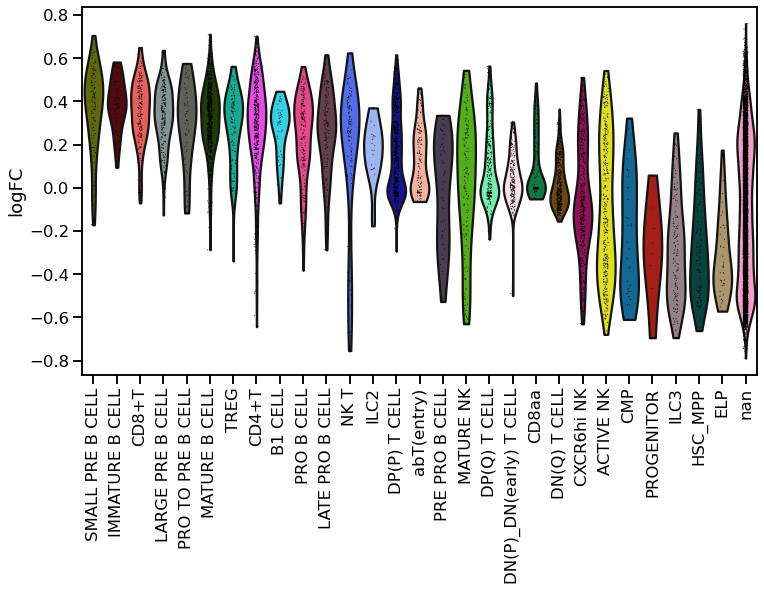

In [837]:
plt.rcParams["figure.figsize"] = [10,7]

sorted_annos = nhood_adata[keep_nhoods].obs[nhood_adata[keep_nhoods].obs["nhood_annotation_LYMPHOID"]!="nan"][["nhood_annotation_LYMPHOID","logFC"]].\
    groupby('nhood_annotation_LYMPHOID').\
    median().\
    sort_values("logFC", ascending=False).index

sc.pl.violin(nhood_adata[keep_nhoods], "logFC", 
             groupby="nhood_annotation_LYMPHOID",rotation=90,
            order=sorted_annos)
# sc.pl.violin(nhood_adata[keep_nhoods], "logFC", 
#              groupby="nhood_annotation",rotation=90)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  from ipykernel import kernelapp as app
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:19: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


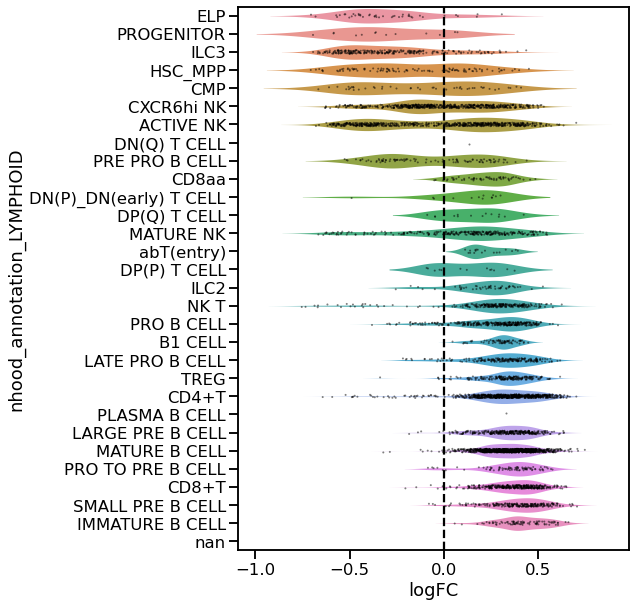

In [928]:
anno_col = 'nhood_annotation_LYMPHOID'
alpha=0.1

sorted_annos = nhood_adata.obs[nhood_adata.obs[anno_col]!="nan"][[anno_col,"logFC"]].\
    groupby(anno_col).\
    median().\
    sort_values("logFC", ascending=True).index

anno_df = nhood_adata.obs[[anno_col, "logFC", "SpatialFDR"]]
anno_df['is_signif'] = anno_df['SpatialFDR'] < alpha
# anno_df['across_organs'] = ["Significant across organs" if x else "" for x in (keep_nhoods & signif_nhoods)]
anno_df = anno_df[anno_df[anno_col]!="nan"]

plt.rcParams["figure.figsize"] = [7,10]
sns.violinplot(data=anno_df[keep_nhoods], y=anno_col, x="logFC", order=sorted_annos, 
               size=190, cmap="Set1", inner=None, orient="h",
               linewidth=0,
              scale="width")
sns.stripplot(data=anno_df[keep_nhoods], y=anno_col, x="logFC", order=sorted_annos, size=2, 
#               hue="across_organs",palette=['black','red'],
              color="black",
              orient="h", alpha=0.5);
plt.axvline(x=0, ymin=0, ymax=1, color="black", linestyle="--")

Add updated LYMPHOID annotation by Chenqu

In [933]:
anno_dir = "/nfs/team205/ed6/bin/Pan_fetal_immune/metadata/manual_annotation/"
anno_df = pd.read_csv(anno_dir + 'PAN.A01.v01.entire_data_normalised_log.20210429.LYMPHOID.csv', index_col=0)

In [936]:
adata.obs = pd.concat([adata.obs, anno_df],1)

In [937]:
annotate_nhoods(adata, anno_col="anno_lvl_2")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/scipy/sparse/base.py:595: RuntimeWarning: invalid value encountered in true_divide
  return np.true_divide(self.todense(), other)


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


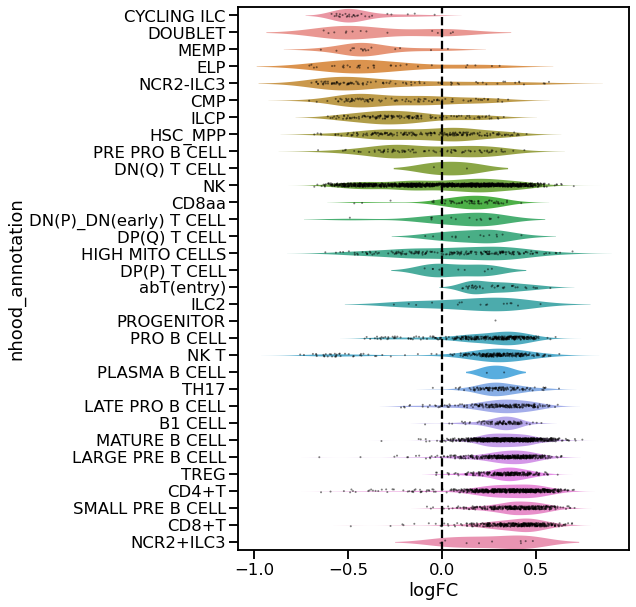

In [941]:
anno_col = 'nhood_annotation'
alpha=0.1

nhood_adata = adata.uns["nhood_adata"].copy()
sorted_annos = nhood_adata.obs[nhood_adata.obs[anno_col]!="nan"][[anno_col,"logFC"]].\
    groupby(anno_col).\
    median().\
    sort_values("logFC", ascending=True).index

anno_df = nhood_adata.obs[[anno_col, "logFC", "SpatialFDR"]]
anno_df['is_signif'] = anno_df['SpatialFDR'] < alpha
# anno_df['across_organs'] = ["Significant across organs" if x else "" for x in (keep_nhoods & signif_nhoods)]
anno_df = anno_df[anno_df[anno_col]!="nan"]

plt.rcParams["figure.figsize"] = [7,10]
sns.violinplot(data=anno_df[keep_nhoods], y=anno_col, x="logFC", order=sorted_annos, 
               size=190, cmap="Set1", inner=None, orient="h",
               linewidth=0,
              scale="width")
sns.stripplot(data=anno_df[keep_nhoods], y=anno_col, x="logFC", order=sorted_annos, size=2, 
#               hue="across_organs",palette=['black','red'],
              color="black",
              orient="h", alpha=0.5);
plt.axvline(x=0, ymin=0, ymax=1, color="black", linestyle="--")

In [944]:
adata[adata.obs["anno_lvl_1"]=="ILC"]

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


View of AnnData object with n_obs × n_vars = 6222 × 33538 backed at '/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.20210429.HSC_IMMUNE.embedding.h5ad'
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'nhood_ixs_random', 'nhood_ixs_refined', 'Nhood', 'age_bins', 'anno_lvl_1', 'anno_lvl_2', 'anno_lvl_3'
    var: 'GeneID', 'GeneName', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'anno_lvl_2_LYMPHOID_colors', 'anno_lvl_2_MEM_PROGENITORS_colors', 'anno_lvl_2_MYELOID_colors', 'donor_colors', 'isin_HSC_IMMUNE_colors', 'isin_LYMPHOID_colors', 'isin_MEM_PROGENITORS_colors', 'isin_MYELOID_LYMPHOID_

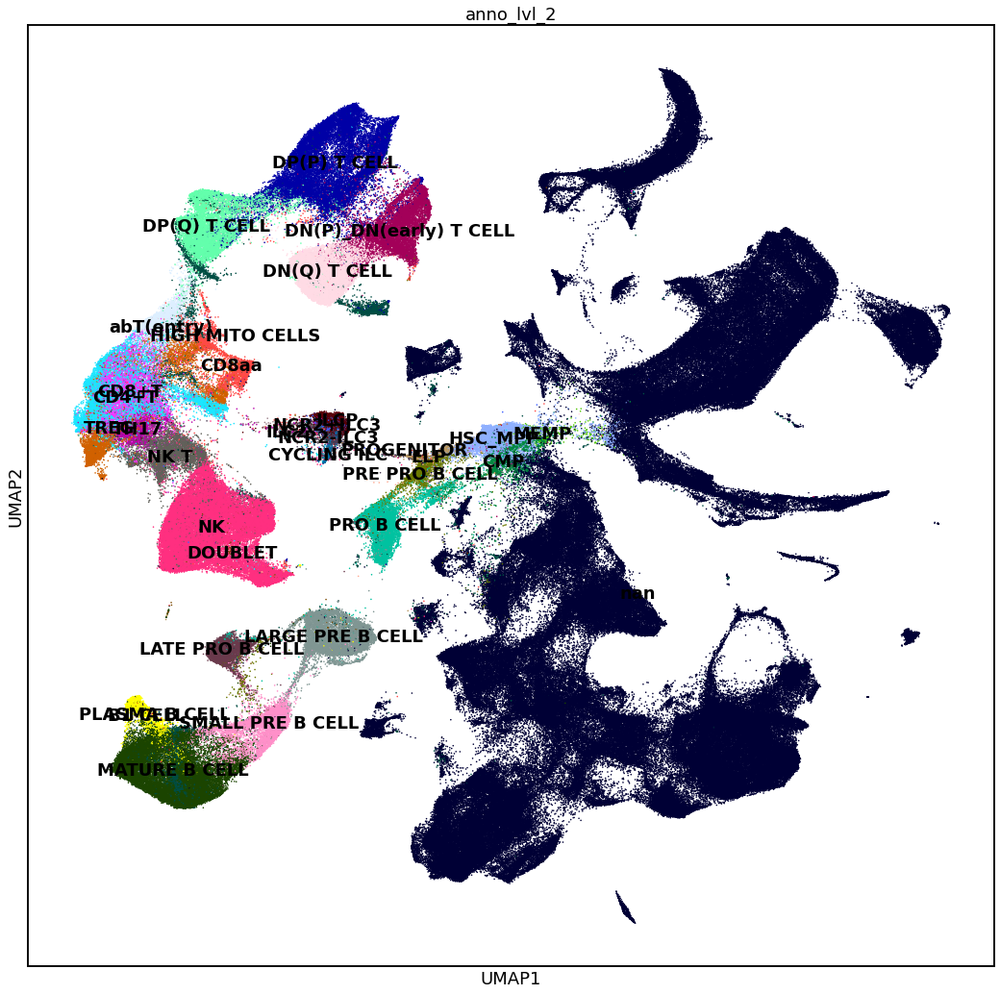

In [1069]:
plt.rcParams["figure.figsize"] = [18,18]
sc.pl.umap(adata, color="anno_lvl_2", size=10, legend_loc="on data")

In [976]:
ILC_fractions = nhood_adata.obsm["frac_annotation"][:,['ILC' in x for x in nhood_adata.uns["annotation_labels"]]]
# ILC_fractions = ILC_fractions[~np.isnan(ILC_fractions.sum(1)),:]

In [977]:
ILC_nhoods = (ILC_fractions.sum(1)!=0) & ~np.isnan(ILC_fractions.sum(1))

In [988]:
ilc_names = [x + "_fraction" for x in nhood_adata.uns["annotation_labels"] if 'ILC' in x]
ilc_df = pd.DataFrame(ILC_fractions, columns=ilc_names)
ilc_df.index = nhood_adata.obs_names.copy()
nhood_adata.obs = pd.concat([nhood_adata.obs, ilc_df],1)

In [1000]:
nhood_adata.obs["across_organs"] = keep_nhoods
nhood_adata.obs["is_signif"] = nhood_adata.obs["SpatialFDR"] < 0.1

In [1013]:
import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

In [1014]:
anndata2ri.activate()

In [1015]:
%load_ext rpy2.ipython


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [1016]:
df = nhood_adata[ILC_nhoods].obs[["across_organs", "logFC", "SpatialFDR"] + ilc_names]

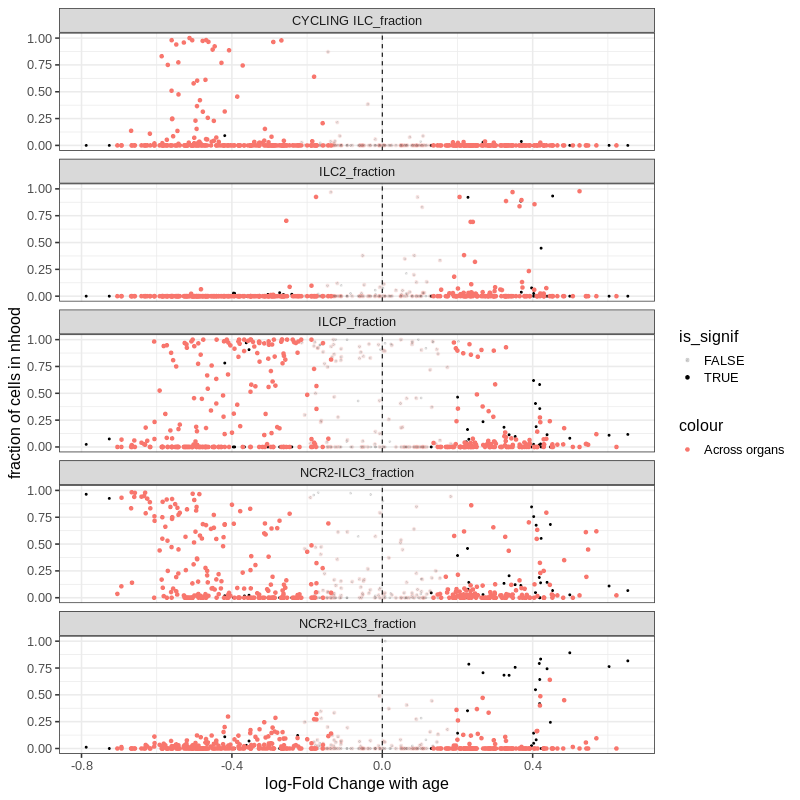

In [1054]:
%%R -i df -i ilc_names -w 800 -h 800
library(tidyverse)
ilc_names <- unlist(ilc_names)
df %>%
    pivot_longer(cols=ilc_names, names_to="celltype", values_to="fraction") %>%
    mutate(is_signif = SpatialFDR < 0.1) %>%
    ggplot(aes(logFC, fraction, alpha=is_signif)) +
    geom_point(size=0.7) +
    geom_point(data=. %>% filter(across_organs), aes(color="Across organs")) +
    facet_wrap(celltype~., ncol=1) +
    geom_vline(xintercept=0, linetype=2) +
    theme_bw(base_size=16) +
    xlab("log-Fold Change with age") +
    ylab("fraction of cells in nhood")
#     geom_smooth()

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


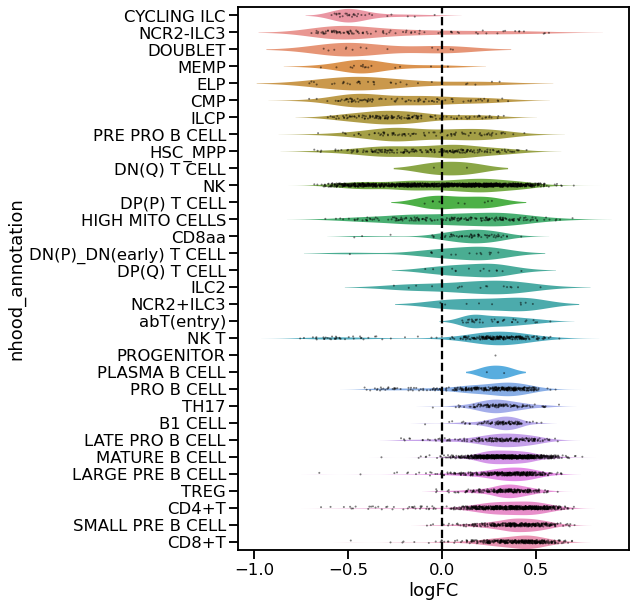

KeyError: 'Cannot find cbc in adata.uns["nhood_adata"].obs --                 please run milopy.utils.annotate_nhoods(adata, anno_col) first'

In [1083]:
def plot_DA_beeswarm(
    adata, 
    anno_col = 'nhood_annotation', 
    alpha=0.1,
    subset_nhoods=None
):
    '''
    Plot beeswarm plot
    '''
    try:
        nhood_adata = adata.uns["nhood_adata"].copy()
    except KeyError:
        raise KeyError(
                'Cannot find "nhood_adata" slot in adata.uns -- please run milopy.make_nhoods_adata(adata)'
            )

    if subset_nhoods is not None:
        nhood_adata = nhood_adata[subset_nhoods]
    
    try:
        nhood_adata.obs[anno_col]
    except KeyError:
        raise KeyError(
                'Cannot find {a} in adata.uns["nhood_adata"].obs -- \
                please run milopy.utils.annotate_nhoods(adata, anno_col) first'.format(a=anno_col)
            )
    
    try:
        nhood_adata.obs["logFC"]
    except KeyError:
        raise KeyError(
                'Cannot find `logFC` in adata.uns["nhood_adata"].obs -- \
                please run milopy.core.DA_nhoods(adata) first'
            )
    
    sorted_annos = nhood_adata.obs[[anno_col,"logFC"]].\
        groupby(anno_col).\
        median().\
        sort_values("logFC", ascending=True).index

    anno_df = nhood_adata.obs[[anno_col, "logFC", "SpatialFDR"]]
    anno_df['is_signif'] = anno_df['SpatialFDR'] < alpha
    # anno_df['across_organs'] = ["Significant across organs" if x else "" for x in (keep_nhoods & signif_nhoods)]
    anno_df = anno_df[anno_df[anno_col]!="nan"]

    sns.violinplot(data=anno_df, y=anno_col, x="logFC", order=sorted_annos, 
                   size=190, cmap="Set1", inner=None, orient="h",
                   linewidth=0,
                  scale="width")
    sns.stripplot(data=anno_df, y=anno_col, x="logFC", order=sorted_annos, size=2, 
                  color="black",
                  orient="h", alpha=0.5);
    plt.axvline(x=0, ymin=0, ymax=1, color="black", linestyle="--")
    
plt.rcParams["figure.figsize"] = [7,10]
plot_DA_beeswarm(adata, subset_nhoods=keep_nhoods);
plt.show()
plot_DA_beeswarm(adata, anno_col="cbc")

Pick one organ at a time for organ specific

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as ca

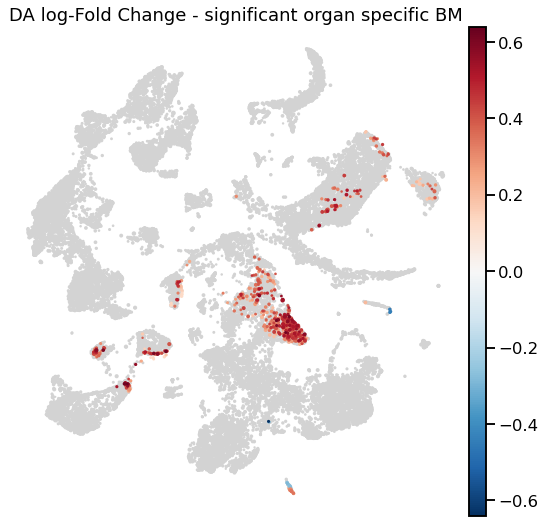

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as ca

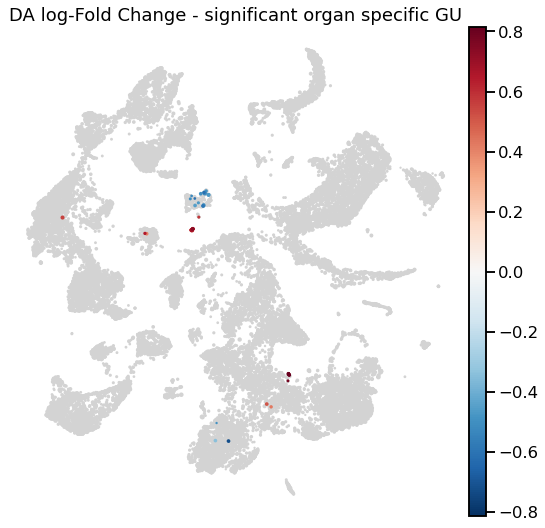

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as ca

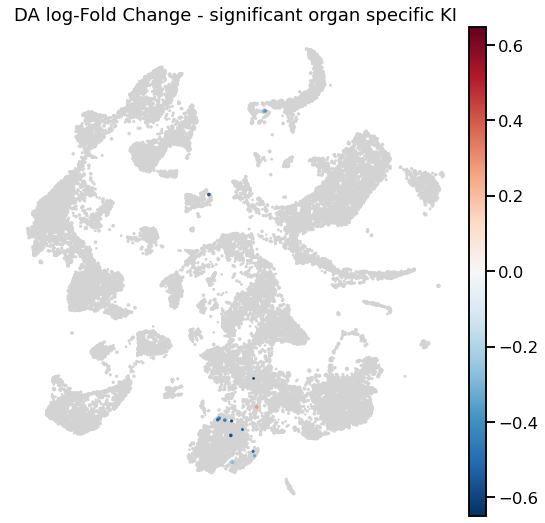

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as ca

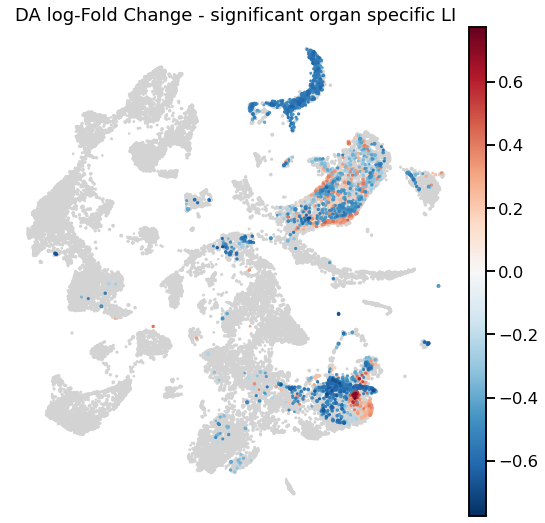

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as ca

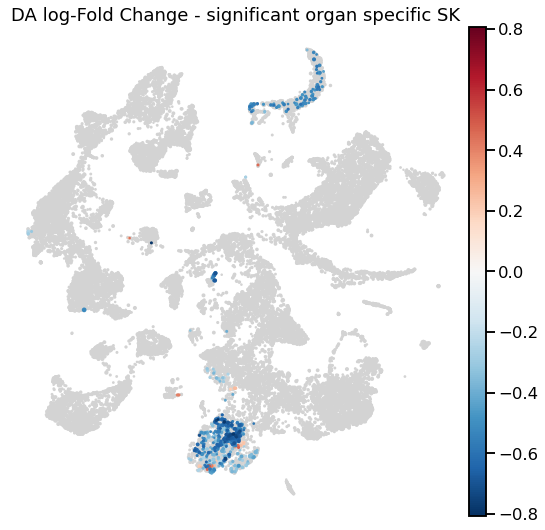

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as ca

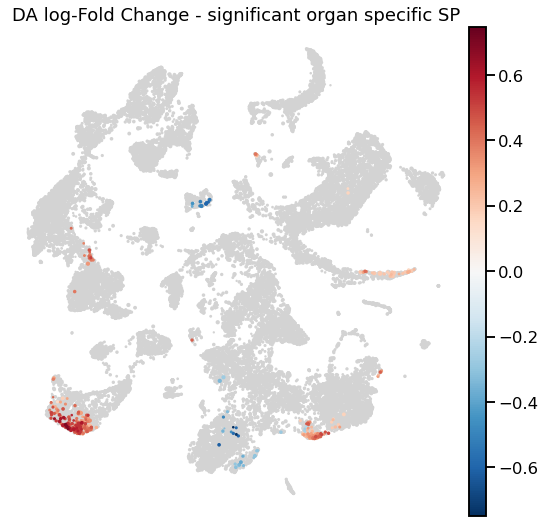

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'nhood_annotation_LYMPHOID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'age_bins' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'organ' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'Sort_id' as ca

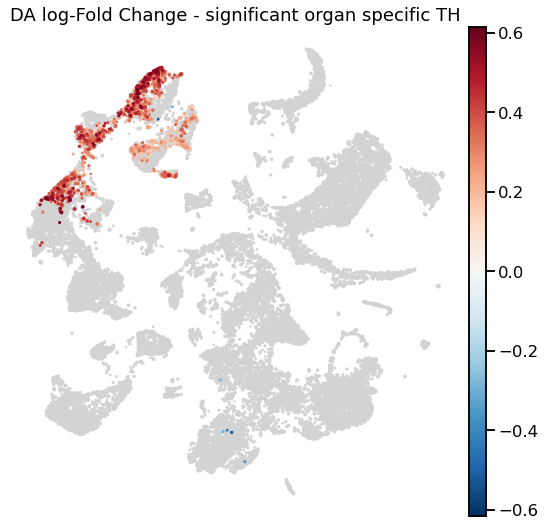

In [831]:
plt.rcParams["figure.figsize"] = [9,9]
max_organ = org_fc.idxmax(1)
for o in [x.strip("logFC_") for x in org_fc.columns]:
    keep_organ = max_organ=="logFC_" + o
    nhood_adata = adata.uns["nhood_adata"].copy()

    nhood_adata.obs["graph_color"] = nhood_adata.obs["logFC"]
    nhood_adata.obs.loc[nhood_adata.obs["SpatialFDR"] > alpha, "graph_color"] = np.nan
    nhood_adata.obs["abs_logFC"] = abs(nhood_adata.obs["logFC"])
    nhood_adata.obs.loc[nhood_adata.obs["abs_logFC"] < min_logFC, "graph_color"] = np.nan

    ## Mask values
    nhood_adata.obs["graph_color"][~(organ_specific_nhoods & keep_organ)] = np.nan

    ## Plotting order - extreme logFC on top
    nhood_adata.obs.loc[nhood_adata.obs["graph_color"].isna(), "abs_logFC"] = np.nan
    ordered = nhood_adata.obs.sort_values('abs_logFC', na_position='first').index
    nhood_adata = nhood_adata[ordered]

    vmax = np.max([nhood_adata.obs["graph_color"].max(), abs(nhood_adata.obs["graph_color"].min())])
    vmin = - vmax

    sc.pl.embedding(nhood_adata, "X_milo_graph", 
                    color="graph_color", cmap="RdBu_r",
                    size=adata.uns["nhood_adata"].obs["Nhood_size"]*min_size, 
                    edges=plot_edges, neighbors_key="nhood",
                    # edge_width = 
                    sort_order=False,
                    frameon=False,
                    vmax=vmax, vmin=vmin,
                    title=title + " - significant organ specific " + o
                   )

### Save outputs

In [1140]:
import scipy.io

outdir = data_dir + "milo_outs"
if not os.path.exists(outdir):
    os.mkdir(outdir)

## Save nhood adata
nhood_adata = adata.uns["nhood_adata"].copy()

## Solving some anndata complaints
nhood_adata.var.index.name = "index" 
nhood_adata.uns["annotation_labels"] = nhood_adata.uns["annotation_labels"].tolist()

nhood_adata.write(outdir + 'PAN.A01.v01.entire_data_normalised_log.20210429.HSC_IMMUNE.embedding.milo_nhoods.h5ad')

## Save nhood matrix
nhood_mat = scipy.sparse.csr_matrix(adata.obsm['nhoods'].copy())

scipy.io.mmwrite(outdir + 'PAN.A01.v01.entire_data_normalised_log.20210429.HSC_IMMUNE.embedding.milo_nhoods_mat.mtx', nhood_mat)

---
---
---

---
---
---

---
---
---

---
---
---

---
---
---

---
---
---

---
---
---

---
---
---

### Test for differential abundance Between organs

In [ ]:
milopy.utils.build_nhood_graph(adata)

In [453]:
# org = "LI"
milo_res_dict = {}
for org in adata.obs.organ.unique():
    adata.obs["is_" + org] = ['1' if x == org else '0' for x in adata.obs["organ"]]
    milo.DA_nhoods(adata, design="~ is_" + org)
    milo_res_dict[org] = adata.uns["nhood_adata"].obs.copy()

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/pyth

... storing 'is_MLN' as categorical
... storing 'organ' as categorical


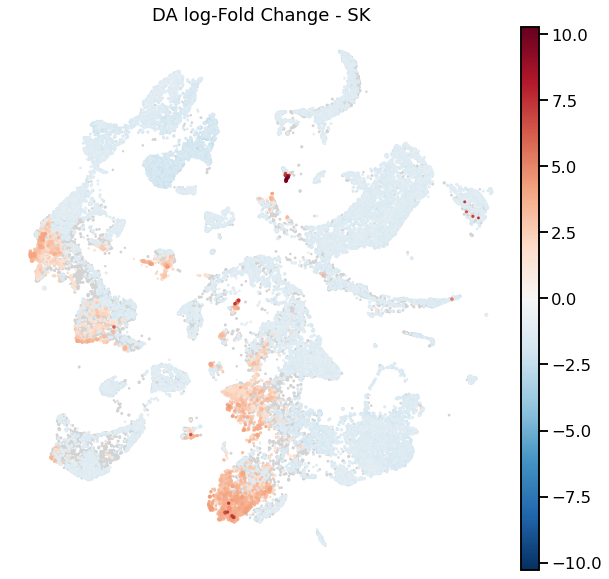

... storing 'is_MLN' as categorical
... storing 'organ' as categorical


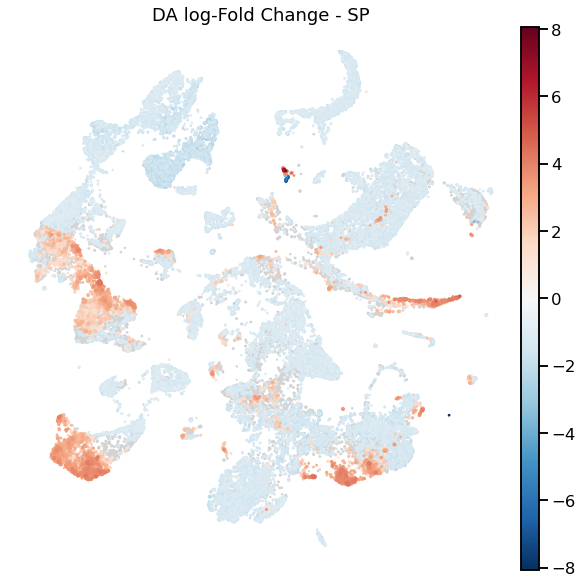

... storing 'is_MLN' as categorical
... storing 'organ' as categorical


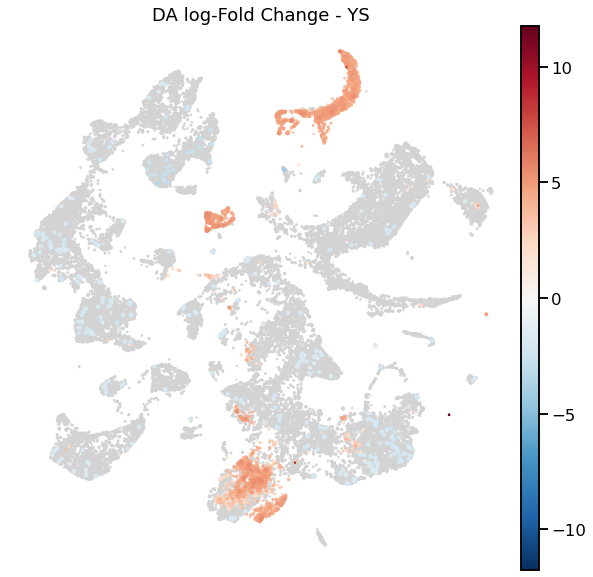

... storing 'is_MLN' as categorical
... storing 'organ' as categorical


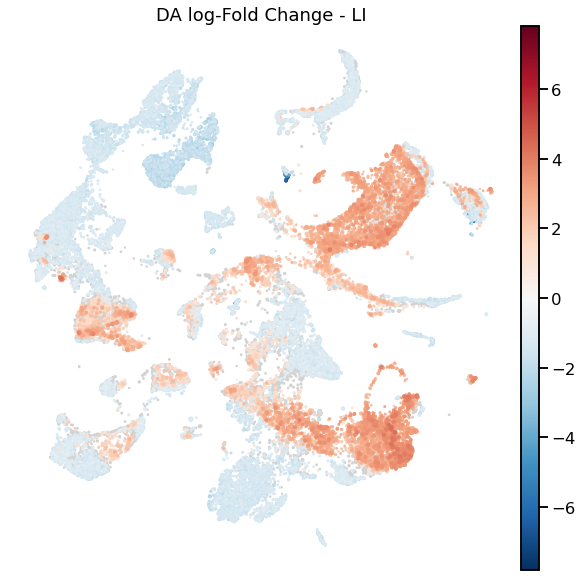

... storing 'is_MLN' as categorical
... storing 'organ' as categorical


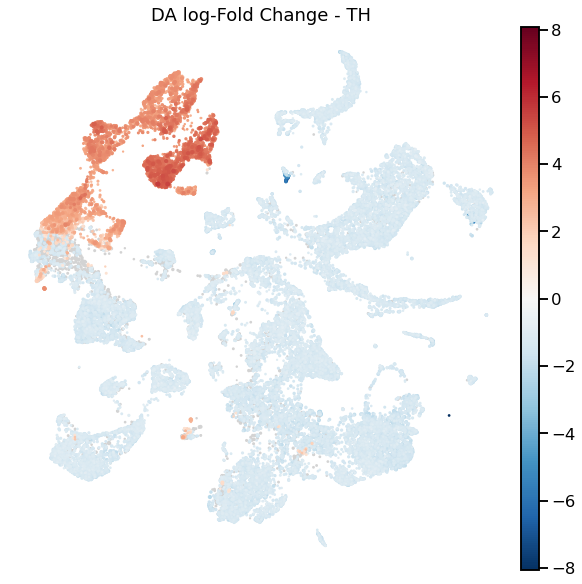

... storing 'is_MLN' as categorical
... storing 'organ' as categorical


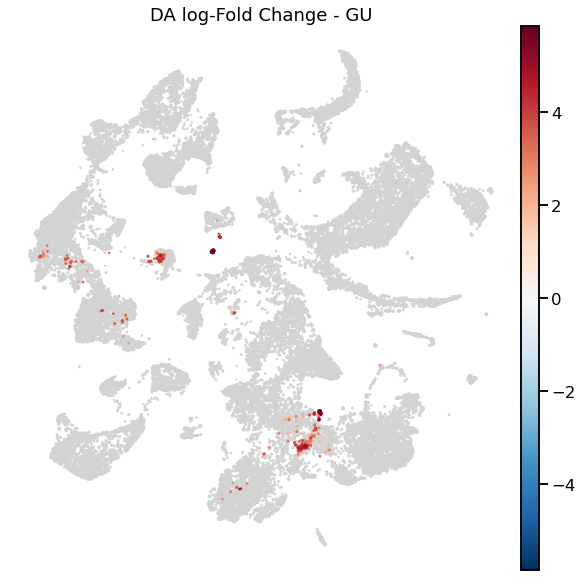

... storing 'is_MLN' as categorical
... storing 'organ' as categorical


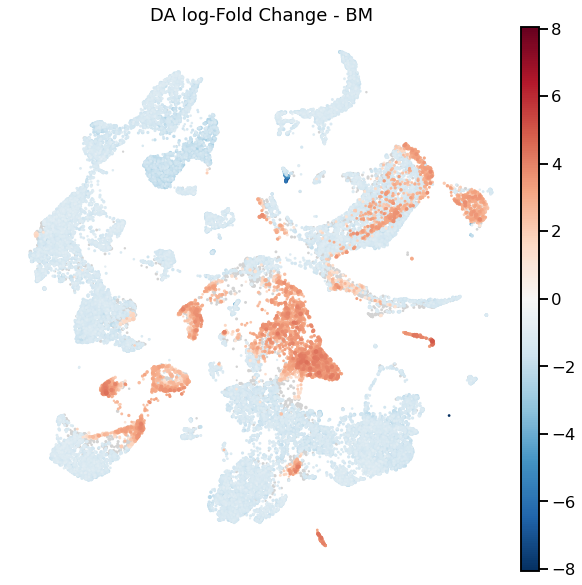

... storing 'is_MLN' as categorical
... storing 'organ' as categorical


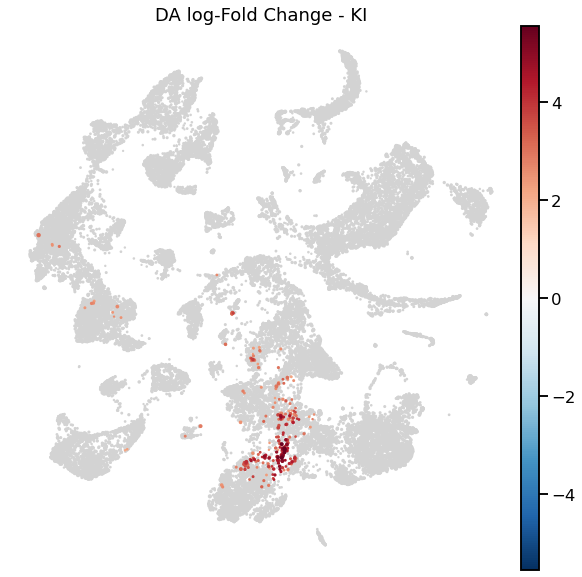

... storing 'is_MLN' as categorical
... storing 'organ' as categorical


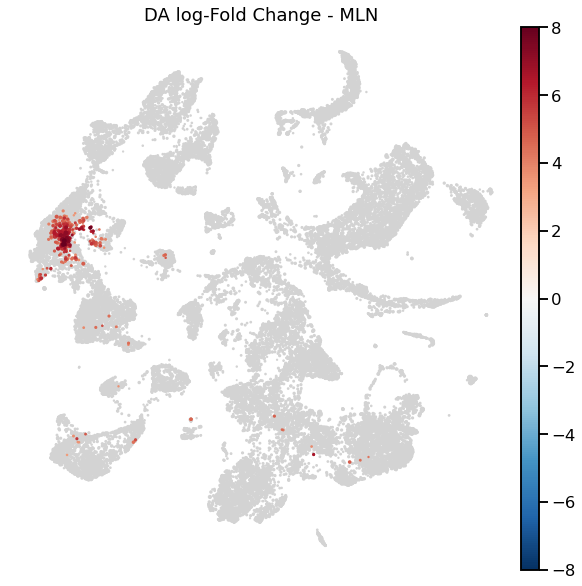

In [557]:
for org,res in milo_res_dict.items():
    nhood_adata = adata.uns["nhood_adata"]
    if any([x in nhood_adata.obs.columns for x in res.columns]):
        nhood_adata.obs = nhood_adata.obs.drop(res.columns, axis=1)
    nhood_adata.obs = pd.concat([nhood_adata.obs, res], 1)
    milopl.plot_nhood_graph(adata, min_size=1, alpha=0.01, title="DA log-Fold Change - " + org, save="milograph_{o}.png".format(o=org) )
#     sc.pl.umap(adata, color="organ", groups=[org], size=3)

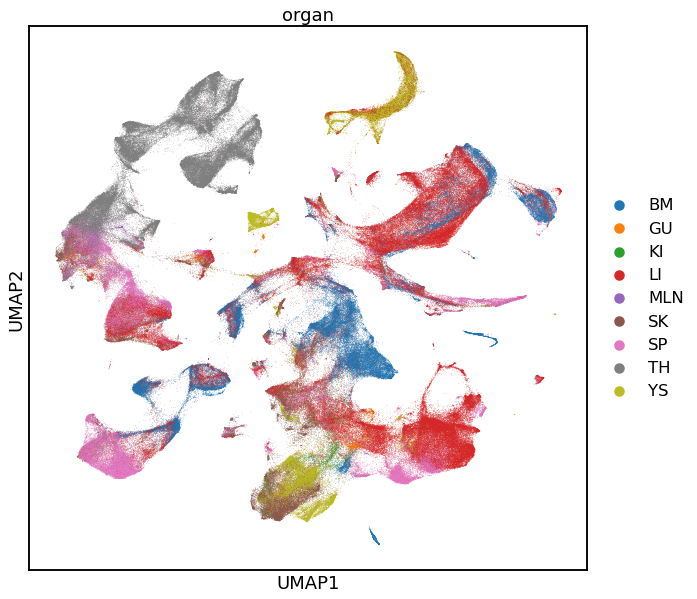

In [561]:
sc.pl.umap(adata, color="organ", size=1, save="organ.png")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


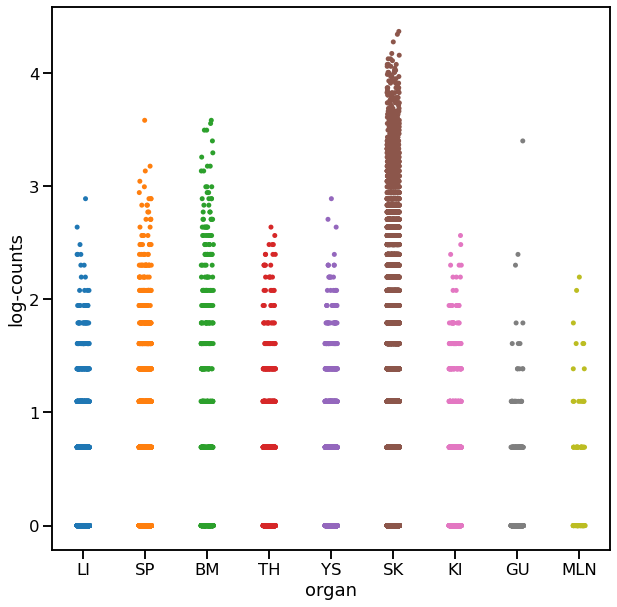

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


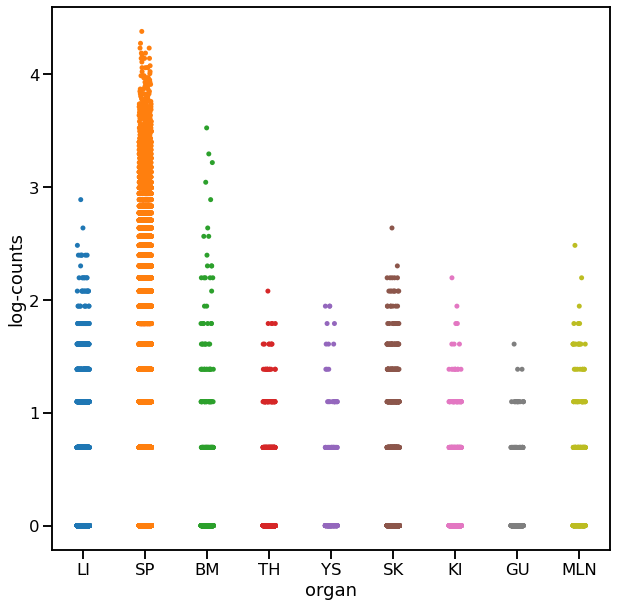

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


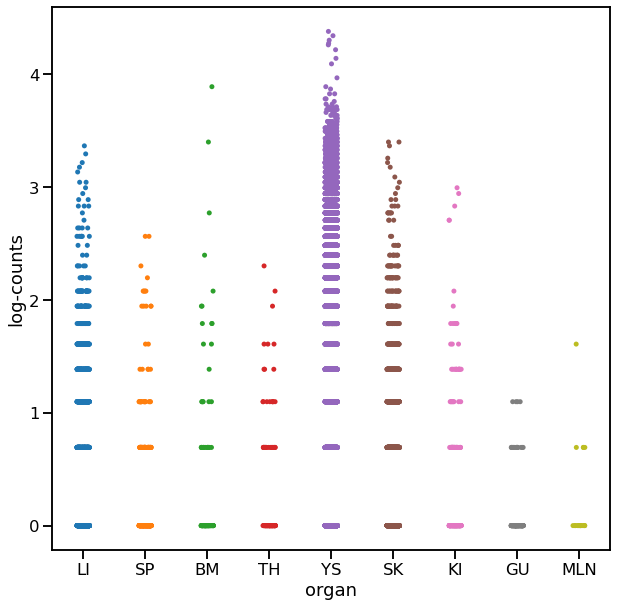

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


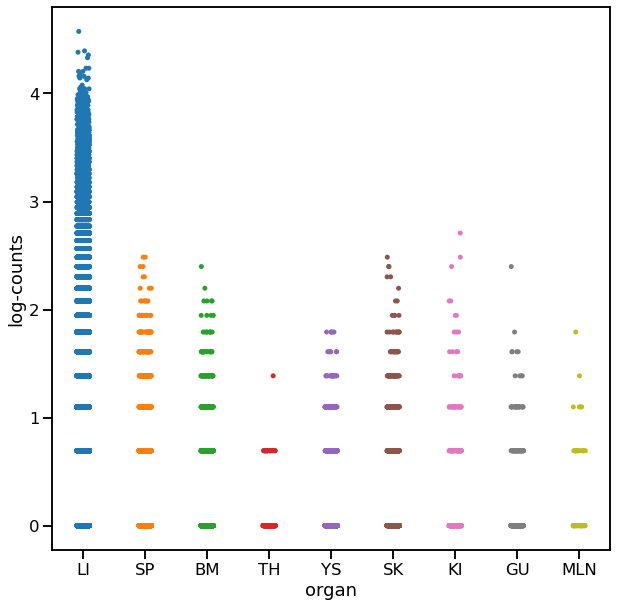

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


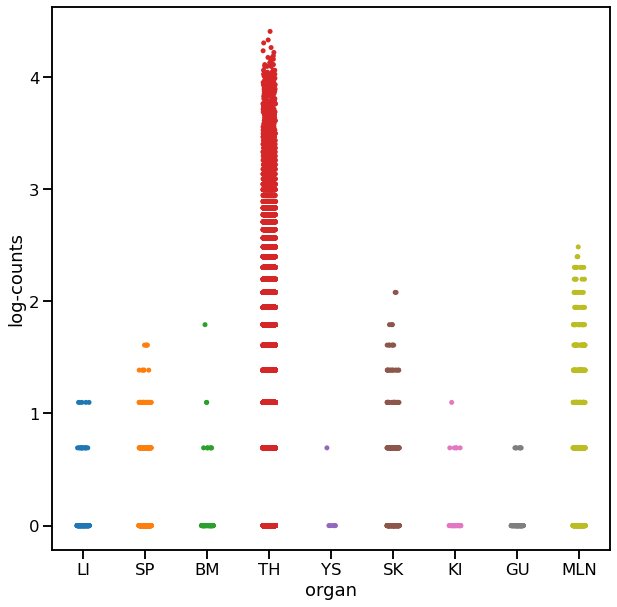

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


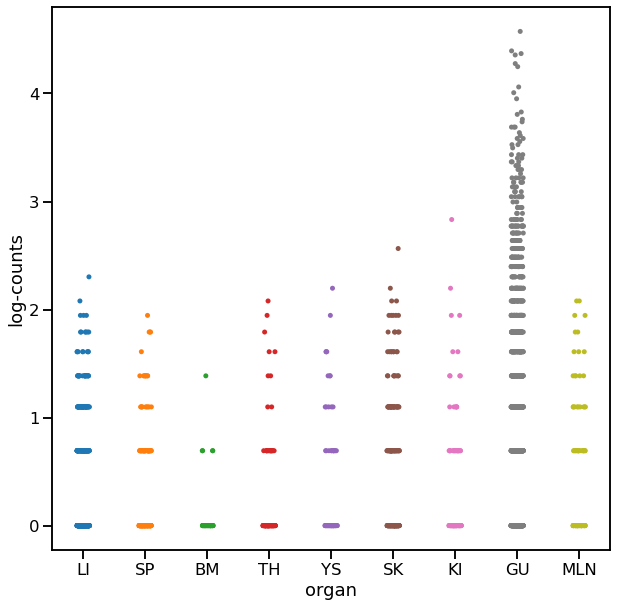

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


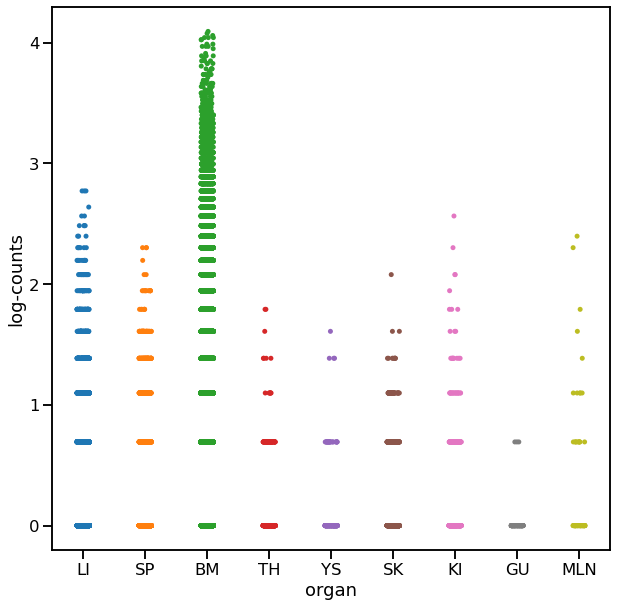

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


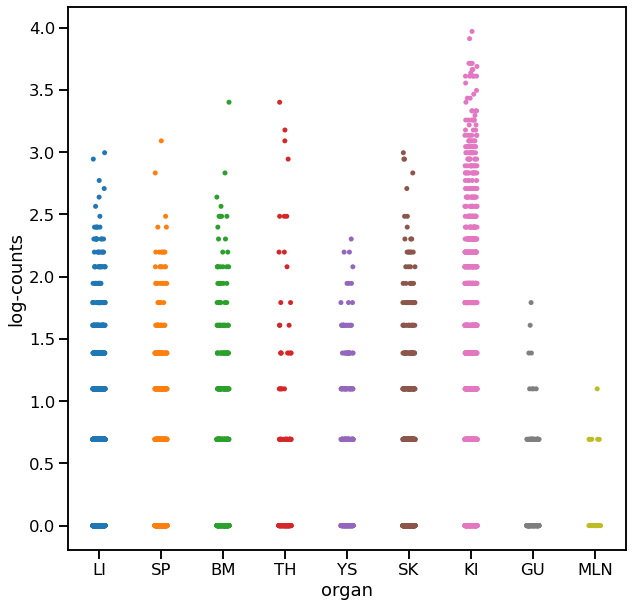

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


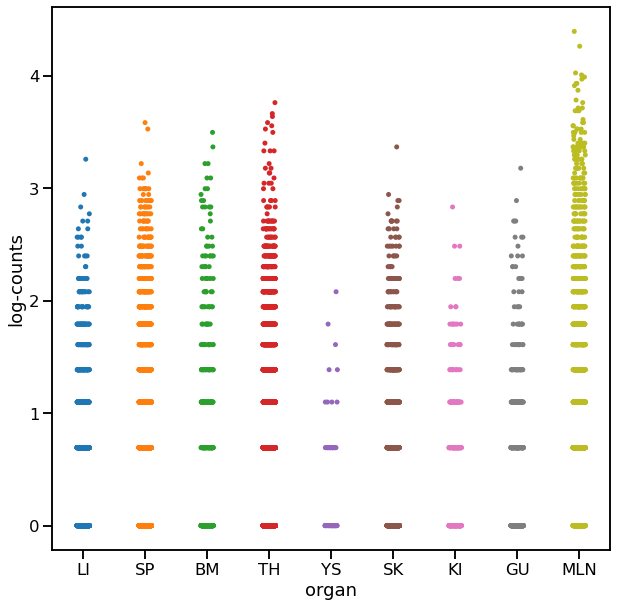

In [555]:
for org,res in milo_res_dict.items():
    nhood_adata = adata.uns["nhood_adata"].copy()
    if any([x in nhood_adata.obs.columns for x in res.columns]):
        nhood_adata.obs = nhood_adata.obs.drop(res.columns, axis=1)
    nhood_adata.obs = pd.concat([nhood_adata.obs, res], 1)
    df = pd.DataFrame(nhood_adata[nhood_adata.obs["logFC"] > 2].X.toarray().T)
    df.index = nhood_adata.var_names
    df["organ"] = nhood_adata.var["organ"]
    df = df.melt(id_vars="organ")
    df["log-counts"] = np.log(df["value"])
    sns.stripplot(data=df, x="organ", y="log-counts");
    plt.show()

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.var` of view, copying.
... storing 'is_MLN' as categorical
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/seaborn/matrix.py:659: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


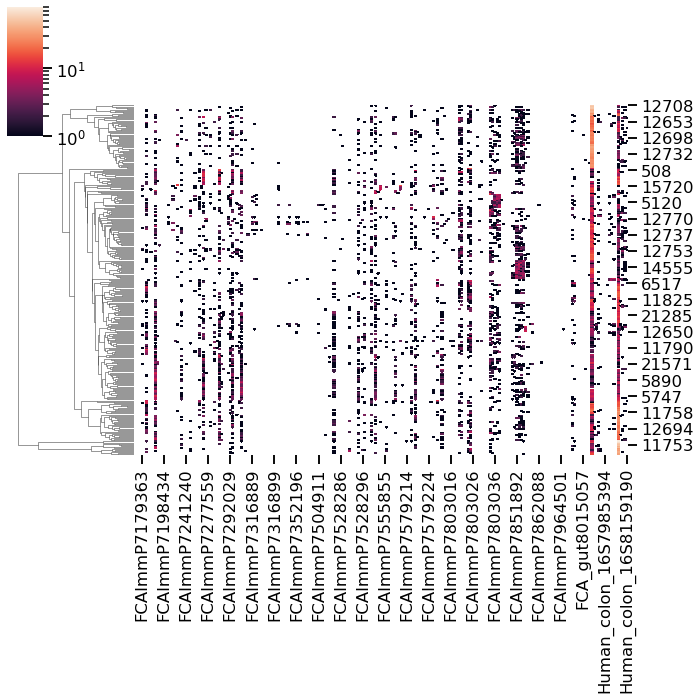

In [502]:
import matplotlib
sc.pl.clustermap(nhood_adata[nhood_adata.obs["SpatialFDR"] < 0.01], norm=matplotlib.colors.LogNorm(),
                col_cluster=False)

In [1082]:
adata.obs[adata.obs["organ"] == "GU"].value_counts("age")

age
15    3851
16    3276
17     716
12     133
dtype: int64

In [24]:
sample_counts_df = pd.DataFrame(adata.uns["nhood_adata"].X.toarray())
sample_counts_df.columns = adata.uns["nhood_adata"].var_names
sample_counts_df.index = small_adata.obs_names

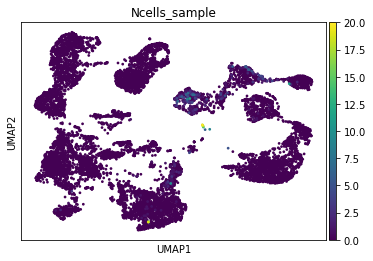

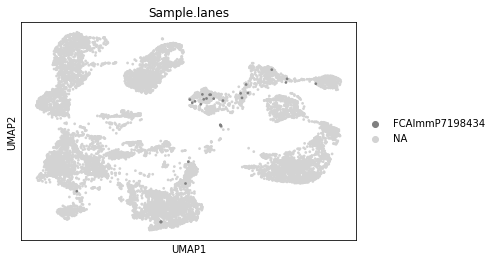

In [25]:
s = sample_counts_df.columns[10]
small_adata.obs["Ncells_sample"] = sample_counts_df[s]
sc.pl.umap(small_adata, color='Ncells_sample', size=30)
sc.pl.umap(small_adata, color='Sample.lanes', size=30, groups=[s])

In [26]:
## Count number of cells per organ
organ_dummies = pd.get_dummies(adata.uns["nhood_adata"].var['organ']).loc[adata.uns["nhood_adata"].var_names]
organ_counts = adata.uns["nhood_adata"].X.dot(csr_matrix(organ_dummies)).toarray()
organ_counts_df = pd.DataFrame(organ_counts)

organ_counts_df.columns = ["Ncells_" + x for x in organ_dummies.columns]
organ_counts_df.index = small_adata.obs_names

organ_frac_df = (organ_counts_df.T/small_adata.obs["Nhood_size"]).T
organ_frac_df.columns = ["Fraccells_" + x for x in organ_dummies.columns]


In [27]:
if organ_counts_df.columns[0] in small_adata.obs.columns:
    small_adata.obs = small_adata.obs.drop(organ_counts_df.columns, axis=1)
small_adata.obs = pd.concat([small_adata.obs, organ_counts_df], axis=1)
if organ_frac_df.columns[0] in small_adata.obs.columns:
    small_adata.obs = small_adata.obs.drop(organ_frac_df.columns, axis=1)
small_adata.obs = pd.concat([small_adata.obs, organ_frac_df], axis=1)

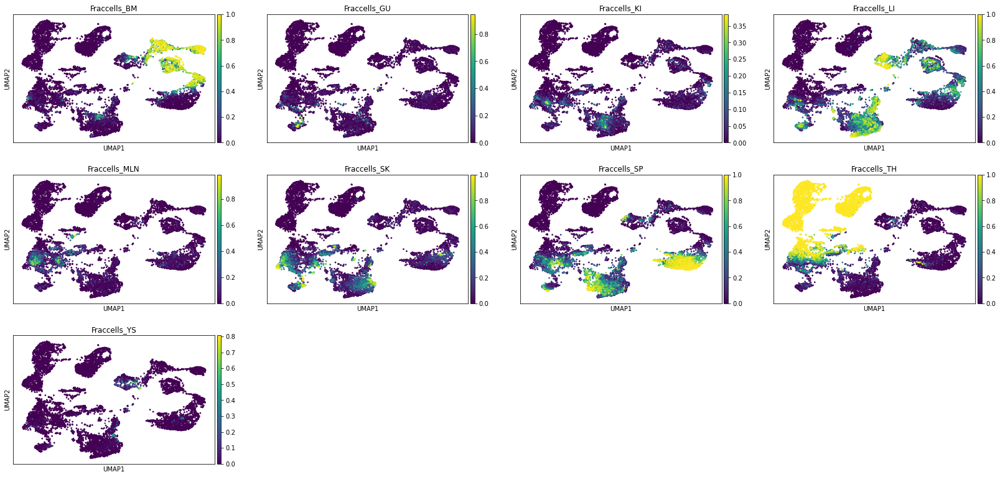

In [28]:
sc.pl.umap(small_adata, color=organ_frac_df.columns, size=30)

In [29]:
## Average age per nhood
age_dummies = adata.uns["nhood_adata"].var['age'].astype("int")
age_nhood = adata.uns["nhood_adata"].X.dot(csr_matrix(age_dummies).T).toarray()
age_nhood = age_nhood/adata.uns["nhood_adata"].X.sum(1)

In [30]:
# if organ_counts_df.columns[0] in small_adata.obs.columns:
#     small_adata.obs = small_adata.obs.drop(organ_counts_df.columns, axis=1)
# small_adata.obs = pd.concat([small_adata.obs, organ_counts_df], axis=1)
# if organ_frac_df.columns[0] in small_adata.obs.columns:
#     small_adata.obs = small_adata.obs.drop(organ_frac_df.columns, axis=1)
small_adata.obs["age_nhood"] = age_nhood
adata.uns["nhood_adata"].obs["age_nhood"] = age_nhood

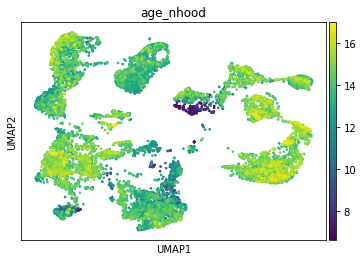

In [31]:
sc.pl.umap(small_adata, color="age_nhood", size=30)

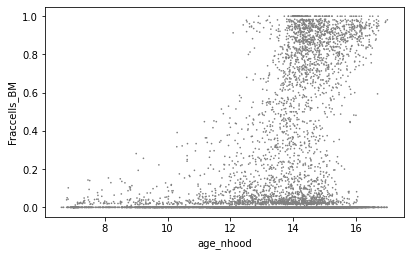

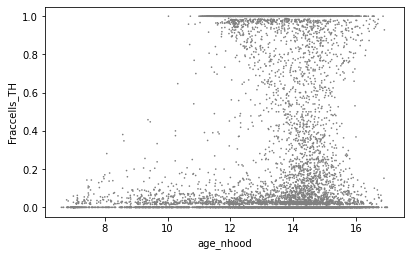

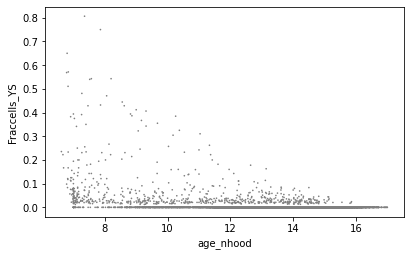

In [32]:
sc.pl.scatter(small_adata, "age_nhood", "Fraccells_BM");
sc.pl.scatter(small_adata, "age_nhood", "Fraccells_TH");
sc.pl.scatter(small_adata, "age_nhood", "Fraccells_YS");

### Wrapping R code

In [ ]:
# # import rpy2's package module
# import rpy2.robjects.packages as rpackages

# # import R's utility package
# utils = rpackages.importr('utils')

# # select a mirror for R packages
# utils.chooseCRANmirror(ind=1) # select the first mirror in the list

# # R package names
# packnames = ('edgeR')

# # R vector of strings
# from rpy2.robjects.vectors import StrVector

# # Selectively install what needs to be install.
# # We are fancy, just because we can.
# names_to_install = [x for x in packnames if not rpackages.isinstalled(x)]
# if len(names_to_install) > 0:
#     utils.install_packages(StrVector(names_to_install))

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


In [152]:
test_nhoods(adata, design="~ age")

In [156]:
build_nhood_graph(adata)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [158]:
plot_nhood_graph(adata, color="logFC")

NameError: name 'color' is not defined

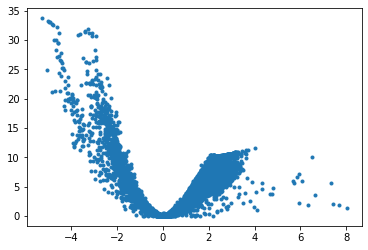

In [50]:
plt.plot(res.logFC, -np.log10(res.PValue),'.')

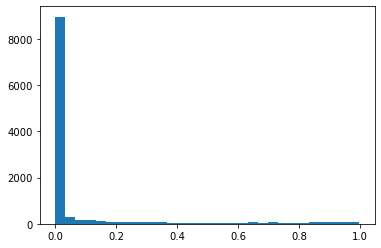

In [55]:
plt.hist(res.PValue, bins=30);

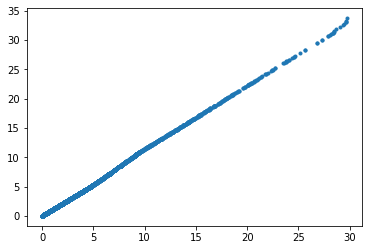

In [51]:
plt.plot(-np.log10(res.FDR), -np.log10(res.PValue),'.')